In [1]:
import sys
sys.path.append('..')

import os
import matplotlib.pyplot as plt
import numpy as np
from skimage.filters import gaussian, threshold_otsu
from skimage.transform import resize
from skimage import io
import pickle
from skimage.measure import regionprops

import matplotlib.pyplot as plt
import torch
import time
import model.model_cnnvae_conditional
import model.optimizer as optimizer
from sklearn.decomposition import PCA
import pandas as pd

In [2]:
# sharedSizes=[128]
# dSpecific_filter=[(16,8)]
sharedSizes=[1024]
dSpecific_filter=[(200,16)]
pID_type='randInit'
pIDemb_size=64
seed=3

In [3]:
holdOutSamples=['HV1','P22','P14','P27']

In [4]:
sourceDir='/data/xinyi/c2p/data/chromark'
segDir=os.path.join(sourceDir,'nuclear_masks')
imgDir=os.path.join(sourceDir,'raw_data')
conditions=['controls','headneck','meningioma', 'glioma']

outSize=128
savename='pathCentered_'+str(outSize)

imgsC_all=None
imgsP_all=None
imgNames_all=None
proteinNames=None
pID_all=None
for condition_i in conditions:
    print(condition_i)
    segDir_i=os.path.join(segDir,condition_i)
    imgDir_i=os.path.join(imgDir,condition_i)
    for stain in os.listdir(segDir_i):
        print(stain)
        segDir_i_stain=os.path.join(segDir_i,stain)
        imgDir_i_stain=os.path.join(imgDir_i,stain)
        
        segPID2name={}
        for pID_dir in os.listdir(segDir_i_stain):
            pID=pID_dir.split('_')
            segPID2name[pID[0]]=pID_dir
        imgPID2name={}
        for pID_dir in os.listdir(imgDir_i_stain):
            pID=pID_dir.split('_')
            imgPID2name[pID[0]]=pID_dir
        for pID in segPID2name.keys():
            if condition_i=='meningioma' and stain=='dapi_gh2ax_lamin_cd3' and pID=='P33': #skipping incorrect images
                continue
            if pID in holdOutSamples:
                print('hold out: '+pID)
                continue
            print(pID)
            if pID not in imgPID2name:
                print('img not found '+pID)
                continue
            imgDir_i_stain_p=os.path.join(imgDir_i_stain,imgPID2name[pID])
            segDir_i_stain_p=os.path.join(segDir_i_stain,segPID2name[pID])
            
            with open(os.path.join(imgDir_i_stain_p,savename+'_imgNames'), 'rb') as output:
                imgNames=pickle.load(output)
            with open(os.path.join(imgDir_i_stain_p,savename+'_img'), 'rb') as output:
                img=pickle.load(output)

            imgP=np.zeros((img.shape[0],1,img.shape[2],img.shape[3]))
            proteinNames_curr=np.array([])
            stain_list=stain.split('_')
            nImgPerStain=int(img.shape[0]/(len(stain_list)-1))
            np.random.seed(3)
            allIdx_all=np.arange(img.shape[0])
            np.random.shuffle(allIdx_all)
            for s in range(1,len(stain_list)):
                s_start=(s-1)*nImgPerStain
                if s==len(stain_list)-1:
                    s_end=img.shape[0]
                else:
                    s_end=s*nImgPerStain
                imgP[s_start:s_end]=img[allIdx_all[s_start:s_end],s].reshape(s_end-s_start,1,img.shape[2],img.shape[3])
                proteinNames_curr=np.concatenate((proteinNames_curr,np.repeat(stain_list[s],s_end-s_start)))
            
            if pID_all is None:
                pID_all=np.repeat(pID,img.shape[0])
                imgsC_all=img[allIdx_all,[0]]
                imgNames_all=imgNames[allIdx_all]
                proteinNames=proteinNames_curr
                imgsP_all=imgP
            else:
                pID_all=np.concatenate((pID_all,np.repeat(pID,img.shape[0])))
                imgsC_all=np.concatenate((imgsC_all,img[allIdx_all,[0]]),axis=0)
                imgNames_all=np.concatenate((imgNames_all,imgNames[allIdx_all]))
                proteinNames=np.concatenate((proteinNames,proteinNames_curr))
                imgsP_all=np.concatenate((imgsP_all,imgP),axis=0)
imgsC_all=imgsC_all.reshape(imgsC_all.shape[0],1,imgsC_all.shape[1],imgsC_all.shape[2])

controls
dapi_gh2ax_lamin
HV5
HV4
HV2
HV10
hold out: HV1
HV7
HV9
HV8
HV3
HV6
dapi_cd8_cd4
hold out: HV1
HV8
HV6
HV7
HV4
HV5
HV3
HV2
headneck
dapi_gh2ax_lamin_cd3
P72
P63
hold out: P14
P44
P41
P56
P18
P55
P50
P24
dapi_cd16_cd4_cd8
P55
P56
P72
hold out: P14
P18
P41
P44
P63
P50
P24
meningioma
dapi_gh2ax_lamin_cd3
hold out: P27
P70
P83
P42
P59
P38
P48
P37
P62
dapi_cd16_cd4_cd8
P42
P48
P62
P38
P83
P37
P33
P70
P59
hold out: P27
glioma
dapi_gh2ax_lamin_cd3
P46
P16
P52
hold out: P22
P84
P47
P57
P15
P29
img not found P29
P68
dapi_cd16_cd4_cd8
P46
P47
P29
P52
P57
hold out: P22
P68
P16
P84
P15


In [5]:
imgsC_all.shape

(29174, 1, 128, 128)

In [6]:
nProt=np.unique(proteinNames).size
pnames,revIdx,pCounts=np.unique(proteinNames,return_inverse=True,return_counts=True)
plabels=torch.tensor(np.arange(pnames.size)[revIdx]).long()

In [7]:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.environ["CUDA_LAUNCH_BLOCKING"] = "0"


In [8]:
#VAE settings
epochs=4250
saveFreq=850
lr_latent=0.001 #initial learning rate
lr_decoder=0.0001
weight_decay=0 #Weight for L2 loss on embedding matrix.

# batchsize=4
batchsize=256
kernel_size=4
stride=2
padding=1

# fc_dim1=6000
hidden1=64 #Number of channels in hidden layer 1
hidden2=128 
hidden3=256
hidden4=256
hidden5=96
hidden5_xy=4
fc_dim1=96*hidden5_xy*hidden5_xy
fc_dim2=6000
# fc_dim3=128
# fc_dim4=128
# gcn_dim1=2600
# adv_hidden=128

dropout=0.01
kl_weight=0.0000001





In [9]:
printFreq=1
trainIdx=np.arange(imgsC_all.shape[0])
def train(epoch):
    t = time.time()
    modelcnn_dna.train()
    modelcnn_protein.train()

    loss_x_train_all_dna=0
    loss_x_train_all_protein=0
    loss_lNorm_all=0
    loss_lNorm_all_dna=0
    loss_lNorm_all_protein=0
    loss_all=0
    ntrainBatches=int(np.ceil(trainIdx.shape[0]/batchsize))
    for i in range(ntrainBatches):
        trainIdx_i=trainIdx[i*batchsize:min((i+1)*batchsize,trainIdx.shape[0])]
        traintarget_protein=torch.tensor(imgsP_all[trainIdx_i]).cuda().float()
        traintarget_dna=torch.tensor(imgsC_all[trainIdx_i]).cuda().float()
        trainIdx_i=torch.tensor(trainIdx_i)
        trainInput_ID=plabels[trainIdx_i].cuda()
        trainInput_shared=latent_shared(trainIdx_i).cuda().float()
        trainInput_dna=latent_dna(trainIdx_i).cuda().float()
        trainInput_protein=latent_protein(trainIdx_i).cuda().float()
        if addNoise:
            trainInput_shared=trainInput_shared+torch.randn_like(trainInput_shared)
            trainInput_dna=trainInput_dna+torch.randn_like(trainInput_dna)
            trainInput_protein=trainInput_protein+torch.randn_like(trainInput_protein)

        optimizer_dna.zero_grad()
        optimizer_protein.zero_grad()
        optimizer_latent.zero_grad()

        recon_dna= modelcnn_dna(torch.cat((trainInput_shared,trainInput_dna),dim=1),pIDemb(trainInput_ID))
        recon_protein= modelcnn_protein(torch.cat((trainInput_shared,trainInput_protein),dim=1),pIDemb(trainInput_ID))
        
        loss_x_train_protein=loss_x(recon_protein, traintarget_protein)
        loss_x_train_dna=loss_x(recon_dna, traintarget_dna)
        
        loss=loss_x_train_protein+loss_x_train_dna
        if addNoise:
            loss_lNorm=torch.mean(torch.linalg.norm(latent_shared(trainIdx_i).cuda(),dim=1))/latent_shared.embedding_dim
            loss_lNorm_all+=loss_lNorm.item()
            loss+=loss_lNorm*actDecay
            
            loss_lNorm_dna=torch.mean(torch.linalg.norm(latent_dna(trainIdx_i).cuda(),dim=1))/latent_dna.embedding_dim
            loss_lNorm_all_dna+=loss_lNorm_dna.item()
            loss+=loss_lNorm_dna*actDecay
            
            loss_lNorm_protein=torch.mean(torch.linalg.norm(latent_protein(trainIdx_i).cuda(),dim=1))/latent_protein.embedding_dim
            loss_lNorm_all_protein+=loss_lNorm_protein.item()
            loss+=loss_lNorm_protein*actDecay
        
        loss_x_train_all_dna+=loss_x_train_dna.item()
        loss_x_train_all_protein+=loss_x_train_protein.item()
        loss_all+=loss.item()
        
        loss.backward()
        optimizer_dna.step()
        optimizer_protein.step()
        optimizer_latent.step()


    loss_x_train_all_dna=loss_x_train_all_dna/ntrainBatches
    loss_x_train_all_protein=loss_x_train_all_protein/ntrainBatches
    loss_all=loss_all/ntrainBatches
    if addNoise:
        loss_lNorm_all=loss_lNorm_all/ntrainBatches
        loss_lNorm_all_dna=loss_lNorm_all_dna/ntrainBatches
        loss_lNorm_all_protein=loss_lNorm_all_protein/ntrainBatches


    if epoch%printFreq==0:
        print('Epoch: {:04d}'.format(epoch),
              'loss_train: {:.4f}'.format(loss_all),
              'loss_x_train_dna: {:.4f}'.format(loss_x_train_all_dna),
              'loss_x_train_protein: {:.4f}'.format(loss_x_train_all_protein),
              'time: {:.4f}s'.format(time.time() - t))
    return loss_all,loss_x_train_all_dna,loss_x_train_all_protein,loss_lNorm_all,loss_lNorm_all_dna,loss_lNorm_all_protein

In [10]:
match_weight=1
sharedWeight=1
addNoise=True
actDecay=0.001
name_train='splitChannels_conditional_lord_withNoise_bce_noSharedRecon_all'
modelname_train='cnn_vae_pbmc_lord'
logsavepath_train=os.path.join('/data/xinyi/c2p/log/',modelname_train,name_train)
modelsavepath_train=os.path.join('/data/xinyi/c2p/models/',modelname_train,name_train)
plotsavepath_train=os.path.join('/data/xinyi/c2p/plots/',modelname_train,name_train)

if not os.path.exists(os.path.join('/data/xinyi/c2p/log/',modelname_train)):
    os.mkdir(os.path.join('/data/xinyi/c2p/log/',modelname_train))
    os.mkdir(os.path.join('/data/xinyi/c2p/models/',modelname_train))
    os.mkdir(os.path.join('/data/xinyi/c2p/plots/',modelname_train))
if not os.path.exists(logsavepath_train):
    os.mkdir(logsavepath_train)
    os.mkdir(os.path.join(logsavepath_train,'dna'))
    os.mkdir(os.path.join(logsavepath_train,'protein'))
if not os.path.exists(modelsavepath_train):
    os.mkdir(modelsavepath_train)
    os.mkdir(os.path.join(modelsavepath_train,'dna'))
    os.mkdir(os.path.join(modelsavepath_train,'protein'))
if not os.path.exists(plotsavepath_train):
    os.mkdir(plotsavepath_train)
    os.mkdir(os.path.join(plotsavepath_train,'dna'))
    os.mkdir(os.path.join(plotsavepath_train,'protein'))




In [11]:

logsavepath_p_dna=os.path.join(logsavepath_train,'dna')
modelsavepath_p_dna=os.path.join(modelsavepath_train,'dna')
plotsavepath_p_dna=os.path.join(plotsavepath_train,'dna')
if not os.path.exists(logsavepath_p_dna):
    os.mkdir(logsavepath_p_dna)
if not os.path.exists(modelsavepath_p_dna):
    os.mkdir(modelsavepath_p_dna)
if not os.path.exists(plotsavepath_p_dna):
    os.mkdir(plotsavepath_p_dna)

logsavepath_p_protein=os.path.join(logsavepath_train,'protein')
modelsavepath_p_protein=os.path.join(modelsavepath_train,'protein')
plotsavepath_p_protein=os.path.join(plotsavepath_train,'protein')
if not os.path.exists(logsavepath_p_protein):
    os.mkdir(logsavepath_p_protein)
if not os.path.exists(modelsavepath_p_protein):
    os.mkdir(modelsavepath_p_protein)
if not os.path.exists(plotsavepath_p_protein):
    os.mkdir(plotsavepath_p_protein)



for currLatentSize in sharedSizes:
    for dSpecificSize,dfilterSize in dSpecific_filter:
        latent_curr=None
        if os.path.exists(os.path.join(plotsavepath_p_dna,'loss_seed3_match'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg')):
            continue


        print(currLatentSize)
        print(dSpecificSize)
        dna_cShared=hidden5-dfilterSize
        p_cShared=dna_cShared

        loss_x=torch.nn.BCEWithLogitsLoss()

        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.enabled = True
        if modelname_train=='cnn_vae_pbmc_lord':
            modelcnn_dna = model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,pIDemb_size,applySigmoid=False)
            modelcnn_protein = model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,pIDemb_size,applySigmoid=False)
        modelcnn_dna.cuda()
        modelcnn_protein.cuda()

        optimizer_dna = torch.optim.Adam(modelcnn_dna.parameters(), lr=lr_decoder, weight_decay=weight_decay)
        optimizer_protein = torch.optim.Adam(modelcnn_protein.parameters(), lr=lr_decoder, weight_decay=weight_decay)

        train_loss=[np.inf]*(epochs)
        train_loss_x_dna=[np.inf]*(epochs)
        train_loss_x_protein=[np.inf]*(epochs)
        
        train_lNorm=[np.inf]*(epochs)
        train_lNorm_dna=[np.inf]*(epochs)
        train_lNorm_protein=[np.inf]*(epochs)

        t_ep=time.time()

        stateDict_train_dna={}
        stateDict_train_protein={}
        
        latent_shared=torch.nn.Embedding(proteinNames.size,currLatentSize)
        latent_protein=torch.nn.Embedding(proteinNames.size,dSpecificSize)
        latent_dna=torch.nn.Embedding(proteinNames.size,dSpecificSize)
        pIDemb=torch.nn.Embedding(nProt, pIDemb_size).cuda()
        optimizer_latent= torch.optim.Adam([latent_shared.weight,latent_protein.weight,latent_dna.weight,pIDemb.weight], lr=lr_latent, weight_decay=weight_decay)


        for ep in range(epochs):
            train_loss[ep],train_loss_x_dna[ep],train_loss_x_protein[ep],train_lNorm[ep],train_lNorm_dna[ep],train_lNorm_protein[ep]=train(ep)



            if ep%saveFreq == (saveFreq-1):
                stateDict_train_dna[ep]=modelcnn_dna.cpu().state_dict()
                stateDict_train_protein[ep]=modelcnn_protein.cpu().state_dict()
                with open(os.path.join(modelsavepath_p_dna,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(latent_dna.weight, output, pickle.HIGHEST_PROTOCOL)
                with open(os.path.join(modelsavepath_p_dna,'latentShared_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(latent_shared.weight, output, pickle.HIGHEST_PROTOCOL)
                with open(os.path.join(modelsavepath_p_protein,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(latent_protein.weight, output, pickle.HIGHEST_PROTOCOL)
                with open(os.path.join(modelsavepath_p_protein,'pIDemb_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(pIDemb.weight, output, pickle.HIGHEST_PROTOCOL)


            modelcnn_dna.cuda()
            modelcnn_protein.cuda()
            torch.cuda.empty_cache()
        print(' total time: {:.4f}s'.format(time.time() - t_ep))

        with open(os.path.join(modelsavepath_p_dna,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(stateDict_train_dna, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(modelsavepath_p_protein,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(stateDict_train_protein, output, pickle.HIGHEST_PROTOCOL)

        with open(os.path.join(logsavepath_p_dna,'train_loss_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(train_loss, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_dna,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(train_loss_x_dna, output, pickle.HIGHEST_PROTOCOL)


        with open(os.path.join(logsavepath_p_protein,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(train_loss_x_protein, output, pickle.HIGHEST_PROTOCOL)
            
        with open(os.path.join(logsavepath_p_dna,'train_lNorm_'+str(currLatentSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(train_lNorm, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_dna,'train_lNormDNA_'+str(currLatentSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(train_lNorm_dna, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_protein,'train_lNormProtein_'+str(currLatentSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(train_lNorm_protein, output, pickle.HIGHEST_PROTOCOL)


        plt.plot(np.arange(epochs),train_loss_x_dna)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed3_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'.jpg'))
        plt.show()


        plt.plot(np.arange(epochs),train_loss_x_protein)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_protein,'loss_seed3_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'.jpg'))
        plt.show()



1024
200
Epoch: 0000 loss_train: 1.0108 loss_x_train_dna: 0.5812 loss_x_train_protein: 0.4294 time: 20.8214s
Epoch: 0001 loss_train: 0.6231 loss_x_train_dna: 0.3810 loss_x_train_protein: 0.2420 time: 18.2917s
Epoch: 0002 loss_train: 0.5495 loss_x_train_dna: 0.3438 loss_x_train_protein: 0.2055 time: 19.2122s
Epoch: 0003 loss_train: 0.5228 loss_x_train_dna: 0.3302 loss_x_train_protein: 0.1924 time: 19.0232s
Epoch: 0004 loss_train: 0.5114 loss_x_train_dna: 0.3247 loss_x_train_protein: 0.1865 time: 18.5209s
Epoch: 0005 loss_train: 0.5051 loss_x_train_dna: 0.3223 loss_x_train_protein: 0.1826 time: 19.0343s
Epoch: 0006 loss_train: 0.5004 loss_x_train_dna: 0.3212 loss_x_train_protein: 0.1790 time: 19.0594s
Epoch: 0007 loss_train: 0.4965 loss_x_train_dna: 0.3206 loss_x_train_protein: 0.1757 time: 19.9633s
Epoch: 0008 loss_train: 0.4934 loss_x_train_dna: 0.3202 loss_x_train_protein: 0.1730 time: 19.6956s
Epoch: 0009 loss_train: 0.4915 loss_x_train_dna: 0.3199 loss_x_train_protein: 0.1714 time: 

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Epoch: 3887 loss_train: 0.4341 loss_x_train_dna: 0.2824 loss_x_train_protein: 0.1514 time: 21.2827s
Epoch: 3888 loss_train: 0.4341 loss_x_train_dna: 0.2824 loss_x_train_protein: 0.1514 time: 21.3121s
Epoch: 3889 loss_train: 0.4341 loss_x_train_dna: 0.2824 loss_x_train_protein: 0.1514 time: 21.3232s
Epoch: 3890 loss_train: 0.4341 loss_x_train_dna: 0.2824 loss_x_train_protein: 0.1514 time: 21.2418s
Epoch: 3891 loss_train: 0.4341 loss_x_train_dna: 0.2824 loss_x_train_protein: 0.1514 time: 21.1868s
Epoch: 3892 loss_train: 0.4341 loss_x_train_dna: 0.2824 loss_x_train_protein: 0.1514 time: 21.1248s
Epoch: 3893 loss_train: 0.4341 loss_x_train_dna: 0.2824 loss_x_train_protein: 0.1514 time: 20.8466s
Epoch: 3894 loss_train: 0.4341 loss_x_train_dna: 0.2824 loss_x_train_protein: 0.1515 time: 21.1260s
Epoch: 3895 loss_train: 0.4341 loss_x_train_dna: 0.2824 loss_x_train_protein: 0.1515 time: 21.1260s
Epoch: 3896 loss_train: 0.4341 loss_x_train_dna: 0.2824 loss_x_train_protein: 0.1515 time: 21.0785s


KeyboardInterrupt: 

Epoch: 0152 loss_train: 0.8923 loss_x_train_dna: 0.2898 loss_x_train_protein: 0.1556 loss_xShared_train_dna: 0.2905 loss_xShared_train_protein: 0.1562 time: 58.9205s
Epoch: 0153 loss_train: 0.8922 loss_x_train_dna: 0.2898 loss_x_train_protein: 0.1556 loss_xShared_train_dna: 0.2904 loss_xShared_train_protein: 0.1562 time: 53.9175s
Epoch: 0154 loss_train: 0.8920 loss_x_train_dna: 0.2897 loss_x_train_protein: 0.1556 loss_xShared_train_dna: 0.2904 loss_xShared_train_protein: 0.1561 time: 82.5200s
Epoch: 0155 loss_train: 0.8919 loss_x_train_dna: 0.2897 loss_x_train_protein: 0.1556 loss_xShared_train_dna: 0.2903 loss_xShared_train_protein: 0.1561 time: 63.4745s
Epoch: 0156 loss_train: 0.8918 loss_x_train_dna: 0.2896 loss_x_train_protein: 0.1555 loss_xShared_train_dna: 0.2903 loss_xShared_train_protein: 0.1561 time: 68.0511s
Epoch: 0157 loss_train: 0.8918 loss_x_train_dna: 0.2896 loss_x_train_protein: 0.1556 loss_xShared_train_dna: 0.2902 loss_xShared_train_protein: 0.1562 time: 60.8622s
Epoc

Epoch: 0202 loss_train: 0.8875 loss_x_train_dna: 0.2880 loss_x_train_protein: 0.1551 loss_xShared_train_dna: 0.2888 loss_xShared_train_protein: 0.1554 time: 70.9578s
Epoch: 0203 loss_train: 0.8874 loss_x_train_dna: 0.2880 loss_x_train_protein: 0.1551 loss_xShared_train_dna: 0.2888 loss_xShared_train_protein: 0.1554 time: 85.0795s
Epoch: 0204 loss_train: 0.8873 loss_x_train_dna: 0.2880 loss_x_train_protein: 0.1550 loss_xShared_train_dna: 0.2888 loss_xShared_train_protein: 0.1554 time: 75.5586s
Epoch: 0205 loss_train: 0.8873 loss_x_train_dna: 0.2880 loss_x_train_protein: 0.1550 loss_xShared_train_dna: 0.2888 loss_xShared_train_protein: 0.1553 time: 74.8267s
Epoch: 0206 loss_train: 0.8873 loss_x_train_dna: 0.2879 loss_x_train_protein: 0.1551 loss_xShared_train_dna: 0.2887 loss_xShared_train_protein: 0.1553 time: 71.7160s
Epoch: 0207 loss_train: 0.8873 loss_x_train_dna: 0.2879 loss_x_train_protein: 0.1552 loss_xShared_train_dna: 0.2887 loss_xShared_train_protein: 0.1553 time: 71.4224s
Epoc

Epoch: 0252 loss_train: 0.8846 loss_x_train_dna: 0.2871 loss_x_train_protein: 0.1546 loss_xShared_train_dna: 0.2878 loss_xShared_train_protein: 0.1549 time: 59.9285s
Epoch: 0253 loss_train: 0.8847 loss_x_train_dna: 0.2871 loss_x_train_protein: 0.1547 loss_xShared_train_dna: 0.2878 loss_xShared_train_protein: 0.1549 time: 71.3619s
Epoch: 0254 loss_train: 0.8845 loss_x_train_dna: 0.2870 loss_x_train_protein: 0.1546 loss_xShared_train_dna: 0.2878 loss_xShared_train_protein: 0.1549 time: 61.9436s
Epoch: 0255 loss_train: 0.8843 loss_x_train_dna: 0.2870 loss_x_train_protein: 0.1545 loss_xShared_train_dna: 0.2877 loss_xShared_train_protein: 0.1548 time: 71.0984s
Epoch: 0256 loss_train: 0.8843 loss_x_train_dna: 0.2870 loss_x_train_protein: 0.1545 loss_xShared_train_dna: 0.2877 loss_xShared_train_protein: 0.1548 time: 72.2377s
Epoch: 0257 loss_train: 0.8842 loss_x_train_dna: 0.2870 loss_x_train_protein: 0.1545 loss_xShared_train_dna: 0.2877 loss_xShared_train_protein: 0.1549 time: 70.4928s
Epoc

Epoch: 0302 loss_train: 0.8824 loss_x_train_dna: 0.2865 loss_x_train_protein: 0.1541 loss_xShared_train_dna: 0.2872 loss_xShared_train_protein: 0.1544 time: 70.4969s
Epoch: 0303 loss_train: 0.8825 loss_x_train_dna: 0.2865 loss_x_train_protein: 0.1543 loss_xShared_train_dna: 0.2872 loss_xShared_train_protein: 0.1544 time: 66.5314s
Epoch: 0304 loss_train: 0.8825 loss_x_train_dna: 0.2864 loss_x_train_protein: 0.1542 loss_xShared_train_dna: 0.2872 loss_xShared_train_protein: 0.1544 time: 61.3066s
Epoch: 0305 loss_train: 0.8825 loss_x_train_dna: 0.2865 loss_x_train_protein: 0.1543 loss_xShared_train_dna: 0.2871 loss_xShared_train_protein: 0.1544 time: 55.2022s
Epoch: 0306 loss_train: 0.8827 loss_x_train_dna: 0.2866 loss_x_train_protein: 0.1543 loss_xShared_train_dna: 0.2871 loss_xShared_train_protein: 0.1544 time: 67.5935s
Epoch: 0307 loss_train: 0.8824 loss_x_train_dna: 0.2866 loss_x_train_protein: 0.1542 loss_xShared_train_dna: 0.2871 loss_xShared_train_protein: 0.1544 time: 69.5376s
Epoc

Epoch: 0352 loss_train: 0.8808 loss_x_train_dna: 0.2860 loss_x_train_protein: 0.1539 loss_xShared_train_dna: 0.2865 loss_xShared_train_protein: 0.1542 time: 53.1716s
Epoch: 0353 loss_train: 0.8807 loss_x_train_dna: 0.2860 loss_x_train_protein: 0.1539 loss_xShared_train_dna: 0.2865 loss_xShared_train_protein: 0.1542 time: 65.3741s
Epoch: 0354 loss_train: 0.8807 loss_x_train_dna: 0.2860 loss_x_train_protein: 0.1539 loss_xShared_train_dna: 0.2865 loss_xShared_train_protein: 0.1541 time: 66.0917s
Epoch: 0355 loss_train: 0.8806 loss_x_train_dna: 0.2860 loss_x_train_protein: 0.1539 loss_xShared_train_dna: 0.2864 loss_xShared_train_protein: 0.1541 time: 59.2859s
Epoch: 0356 loss_train: 0.8805 loss_x_train_dna: 0.2859 loss_x_train_protein: 0.1539 loss_xShared_train_dna: 0.2864 loss_xShared_train_protein: 0.1541 time: 50.5005s
Epoch: 0357 loss_train: 0.8805 loss_x_train_dna: 0.2859 loss_x_train_protein: 0.1539 loss_xShared_train_dna: 0.2864 loss_xShared_train_protein: 0.1541 time: 61.1223s
Epoc

Epoch: 0402 loss_train: 0.8793 loss_x_train_dna: 0.2856 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2860 loss_xShared_train_protein: 0.1539 time: 58.6754s
Epoch: 0403 loss_train: 0.8793 loss_x_train_dna: 0.2856 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2861 loss_xShared_train_protein: 0.1539 time: 62.4995s
Epoch: 0404 loss_train: 0.8792 loss_x_train_dna: 0.2856 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2860 loss_xShared_train_protein: 0.1539 time: 65.7014s
Epoch: 0405 loss_train: 0.8793 loss_x_train_dna: 0.2856 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2860 loss_xShared_train_protein: 0.1539 time: 65.1974s
Epoch: 0406 loss_train: 0.8793 loss_x_train_dna: 0.2856 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2860 loss_xShared_train_protein: 0.1539 time: 65.6663s
Epoch: 0407 loss_train: 0.8793 loss_x_train_dna: 0.2856 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2860 loss_xShared_train_protein: 0.1539 time: 59.8423s
Epoc

Epoch: 0452 loss_train: 0.8782 loss_x_train_dna: 0.2853 loss_x_train_protein: 0.1534 loss_xShared_train_dna: 0.2857 loss_xShared_train_protein: 0.1536 time: 57.9471s
Epoch: 0453 loss_train: 0.8782 loss_x_train_dna: 0.2853 loss_x_train_protein: 0.1534 loss_xShared_train_dna: 0.2857 loss_xShared_train_protein: 0.1536 time: 54.3846s
Epoch: 0454 loss_train: 0.8781 loss_x_train_dna: 0.2853 loss_x_train_protein: 0.1534 loss_xShared_train_dna: 0.2856 loss_xShared_train_protein: 0.1536 time: 59.2296s
Epoch: 0455 loss_train: 0.8781 loss_x_train_dna: 0.2852 loss_x_train_protein: 0.1534 loss_xShared_train_dna: 0.2856 loss_xShared_train_protein: 0.1536 time: 59.4583s
Epoch: 0456 loss_train: 0.8781 loss_x_train_dna: 0.2852 loss_x_train_protein: 0.1534 loss_xShared_train_dna: 0.2857 loss_xShared_train_protein: 0.1536 time: 59.2357s
Epoch: 0457 loss_train: 0.8780 loss_x_train_dna: 0.2852 loss_x_train_protein: 0.1534 loss_xShared_train_dna: 0.2856 loss_xShared_train_protein: 0.1536 time: 60.9653s
Epoc

Epoch: 0502 loss_train: 0.8771 loss_x_train_dna: 0.2849 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2853 loss_xShared_train_protein: 0.1534 time: 56.6072s
Epoch: 0503 loss_train: 0.8771 loss_x_train_dna: 0.2849 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2853 loss_xShared_train_protein: 0.1534 time: 53.0744s
Epoch: 0504 loss_train: 0.8772 loss_x_train_dna: 0.2850 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2853 loss_xShared_train_protein: 0.1534 time: 54.0114s
Epoch: 0505 loss_train: 0.8772 loss_x_train_dna: 0.2849 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2854 loss_xShared_train_protein: 0.1534 time: 55.7383s
Epoch: 0506 loss_train: 0.8772 loss_x_train_dna: 0.2849 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2854 loss_xShared_train_protein: 0.1534 time: 53.6433s
Epoch: 0507 loss_train: 0.8772 loss_x_train_dna: 0.2850 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2854 loss_xShared_train_protein: 0.1534 time: 57.1577s
Epoc

Epoch: 0552 loss_train: 0.8765 loss_x_train_dna: 0.2847 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2850 loss_xShared_train_protein: 0.1533 time: 56.2088s
Epoch: 0553 loss_train: 0.8764 loss_x_train_dna: 0.2847 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2850 loss_xShared_train_protein: 0.1533 time: 46.2671s
Epoch: 0554 loss_train: 0.8764 loss_x_train_dna: 0.2848 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2850 loss_xShared_train_protein: 0.1533 time: 53.2008s
Epoch: 0555 loss_train: 0.8764 loss_x_train_dna: 0.2848 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2850 loss_xShared_train_protein: 0.1533 time: 46.9831s
Epoch: 0556 loss_train: 0.8764 loss_x_train_dna: 0.2848 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2850 loss_xShared_train_protein: 0.1533 time: 52.8680s
Epoch: 0557 loss_train: 0.8764 loss_x_train_dna: 0.2848 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2850 loss_xShared_train_protein: 0.1533 time: 41.2212s
Epoc

Epoch: 0602 loss_train: 0.8759 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2849 loss_xShared_train_protein: 0.1532 time: 52.9080s
Epoch: 0603 loss_train: 0.8759 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2848 loss_xShared_train_protein: 0.1532 time: 49.2710s
Epoch: 0604 loss_train: 0.8759 loss_x_train_dna: 0.2845 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2848 loss_xShared_train_protein: 0.1532 time: 52.1875s
Epoch: 0605 loss_train: 0.8758 loss_x_train_dna: 0.2845 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2848 loss_xShared_train_protein: 0.1532 time: 51.9737s
Epoch: 0606 loss_train: 0.8758 loss_x_train_dna: 0.2845 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2848 loss_xShared_train_protein: 0.1532 time: 57.1319s
Epoch: 0607 loss_train: 0.8758 loss_x_train_dna: 0.2845 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2848 loss_xShared_train_protein: 0.1532 time: 58.0123s
Epoc

Epoch: 0652 loss_train: 0.8753 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1529 loss_xShared_train_dna: 0.2847 loss_xShared_train_protein: 0.1531 time: 49.8548s
Epoch: 0653 loss_train: 0.8753 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2847 loss_xShared_train_protein: 0.1531 time: 47.1828s
Epoch: 0654 loss_train: 0.8754 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2847 loss_xShared_train_protein: 0.1531 time: 52.3928s
Epoch: 0655 loss_train: 0.8754 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2847 loss_xShared_train_protein: 0.1531 time: 51.6180s
Epoch: 0656 loss_train: 0.8754 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2847 loss_xShared_train_protein: 0.1531 time: 53.1271s
Epoch: 0657 loss_train: 0.8752 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2847 loss_xShared_train_protein: 0.1530 time: 41.7382s
Epoc

Epoch: 0702 loss_train: 0.8747 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2845 loss_xShared_train_protein: 0.1530 time: 55.3768s
Epoch: 0703 loss_train: 0.8747 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2845 loss_xShared_train_protein: 0.1530 time: 63.6050s
Epoch: 0704 loss_train: 0.8747 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2844 loss_xShared_train_protein: 0.1530 time: 75.2624s
Epoch: 0705 loss_train: 0.8746 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2844 loss_xShared_train_protein: 0.1530 time: 70.3322s
Epoch: 0706 loss_train: 0.8746 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2845 loss_xShared_train_protein: 0.1530 time: 68.2357s
Epoch: 0707 loss_train: 0.8746 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2844 loss_xShared_train_protein: 0.1530 time: 52.4522s
Epoc

Epoch: 0755 loss_train: 0.8744 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1529 time: 41.9598s
Epoch: 0756 loss_train: 0.8744 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1529 time: 39.2448s
Epoch: 0757 loss_train: 0.8743 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1529 time: 33.6121s
Epoch: 0758 loss_train: 0.8743 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1528 time: 33.0280s
Epoch: 0759 loss_train: 0.8743 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1528 time: 37.3305s
Epoch: 0760 loss_train: 0.8743 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1528 time: 39.6208s
Epoc

Epoch: 0805 loss_train: 0.8739 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1528 time: 40.8835s
Epoch: 0806 loss_train: 0.8739 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1528 time: 43.3405s
Epoch: 0807 loss_train: 0.8739 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1528 time: 39.6967s
Epoch: 0808 loss_train: 0.8738 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1528 time: 43.5531s
Epoch: 0809 loss_train: 0.8738 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1528 time: 40.5330s
Epoch: 0810 loss_train: 0.8738 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1528 time: 43.3346s
Epoc

Epoch: 0855 loss_train: 0.8736 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1528 time: 36.1764s
Epoch: 0856 loss_train: 0.8736 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1529 time: 39.6178s
Epoch: 0857 loss_train: 0.8736 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1528 time: 41.2575s
Epoch: 0858 loss_train: 0.8735 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1528 time: 38.7074s
Epoch: 0859 loss_train: 0.8735 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1528 time: 42.7121s
Epoch: 0860 loss_train: 0.8734 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1527 time: 34.8108s
Epoc

Epoch: 0905 loss_train: 0.8732 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1526 time: 36.8482s
Epoch: 0906 loss_train: 0.8732 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1526 time: 32.7111s
Epoch: 0907 loss_train: 0.8732 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1526 time: 37.8040s
Epoch: 0908 loss_train: 0.8731 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1526 time: 48.4426s
Epoch: 0909 loss_train: 0.8731 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1526 time: 34.5358s
Epoch: 0910 loss_train: 0.8731 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1526 time: 43.2010s
Epoc

Epoch: 0955 loss_train: 0.8728 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1526 time: 39.0944s
Epoch: 0956 loss_train: 0.8728 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1526 time: 49.9489s
Epoch: 0957 loss_train: 0.8728 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1526 time: 41.5951s
Epoch: 0958 loss_train: 0.8728 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1526 time: 42.1985s
Epoch: 0959 loss_train: 0.8728 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1526 time: 40.6185s
Epoch: 0960 loss_train: 0.8728 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1526 time: 39.2204s
Epoc

Epoch: 1005 loss_train: 0.8725 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1525 time: 53.2370s
Epoch: 1006 loss_train: 0.8725 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1525 time: 58.3536s
Epoch: 1007 loss_train: 0.8725 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1525 time: 59.1493s
Epoch: 1008 loss_train: 0.8725 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1525 time: 59.2420s
Epoch: 1009 loss_train: 0.8725 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1525 time: 47.1736s
Epoch: 1010 loss_train: 0.8725 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1525 time: 57.4083s
Epoc

Epoch: 1055 loss_train: 0.8724 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1525 time: 42.9864s
Epoch: 1056 loss_train: 0.8724 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1525 time: 60.4967s
Epoch: 1057 loss_train: 0.8724 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1525 time: 52.0455s
Epoch: 1058 loss_train: 0.8724 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1525 time: 54.8537s
Epoch: 1059 loss_train: 0.8724 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1525 time: 57.8463s
Epoch: 1060 loss_train: 0.8724 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1524 time: 54.5525s
Epoc

Epoch: 1105 loss_train: 0.8721 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 59.1178s
Epoch: 1106 loss_train: 0.8721 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 55.9003s
Epoch: 1107 loss_train: 0.8721 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 58.6578s
Epoch: 1108 loss_train: 0.8721 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 52.5185s
Epoch: 1109 loss_train: 0.8721 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 59.7108s
Epoch: 1110 loss_train: 0.8721 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 57.3074s
Epoc

Epoch: 1155 loss_train: 0.8719 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 48.1205s
Epoch: 1156 loss_train: 0.8719 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 39.5319s
Epoch: 1157 loss_train: 0.8719 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 36.5372s
Epoch: 1158 loss_train: 0.8719 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 37.7648s
Epoch: 1159 loss_train: 0.8719 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 35.9762s
Epoch: 1160 loss_train: 0.8719 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 34.0639s
Epoc

Epoch: 1205 loss_train: 0.8719 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1524 time: 35.4325s
Epoch: 1206 loss_train: 0.8719 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1524 time: 39.9959s
Epoch: 1207 loss_train: 0.8719 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1524 time: 36.0431s
Epoch: 1208 loss_train: 0.8719 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1524 time: 38.5490s
Epoch: 1209 loss_train: 0.8719 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1524 time: 39.1833s
Epoch: 1210 loss_train: 0.8718 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1524 time: 39.4835s
Epoc

Epoch: 1255 loss_train: 0.8715 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1523 time: 33.0616s
Epoch: 1256 loss_train: 0.8715 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 44.3392s
Epoch: 1257 loss_train: 0.8715 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1523 time: 42.1812s
Epoch: 1258 loss_train: 0.8715 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 43.4481s
Epoch: 1259 loss_train: 0.8715 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 34.1582s
Epoch: 1260 loss_train: 0.8715 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 33.8208s
Epoc

Epoch: 1307 loss_train: 0.8714 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1523 time: 38.1039s
Epoch: 1308 loss_train: 0.8714 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1523 time: 46.6126s
Epoch: 1309 loss_train: 0.8714 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1523 time: 37.4894s
Epoch: 1310 loss_train: 0.8713 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1523 time: 33.1794s
Epoch: 1311 loss_train: 0.8714 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 35.8127s
Epoch: 1312 loss_train: 0.8714 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 40.2028s
Epoc

Epoch: 1357 loss_train: 0.8713 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1523 time: 40.9620s
Epoch: 1358 loss_train: 0.8713 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 44.5158s
Epoch: 1359 loss_train: 0.8713 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 42.8003s
Epoch: 1360 loss_train: 0.8712 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 38.4466s
Epoch: 1361 loss_train: 0.8712 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 46.8468s
Epoch: 1362 loss_train: 0.8712 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 39.5925s
Epoc

Epoch: 1407 loss_train: 0.8710 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 39.1289s
Epoch: 1408 loss_train: 0.8710 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 42.4470s
Epoch: 1409 loss_train: 0.8710 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 40.1615s
Epoch: 1410 loss_train: 0.8711 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 39.2940s
Epoch: 1411 loss_train: 0.8711 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 41.8475s
Epoch: 1412 loss_train: 0.8711 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 36.2376s
Epoc

Epoch: 1460 loss_train: 0.8710 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 56.4486s
Epoch: 1461 loss_train: 0.8710 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 58.7736s
Epoch: 1462 loss_train: 0.8710 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 55.2765s
Epoch: 1463 loss_train: 0.8710 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 58.7020s
Epoch: 1464 loss_train: 0.8710 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 50.4992s
Epoch: 1465 loss_train: 0.8710 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1522 time: 55.5661s
Epoc

Epoch: 1510 loss_train: 0.8708 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1522 time: 59.1804s
Epoch: 1511 loss_train: 0.8709 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1522 time: 52.4007s
Epoch: 1512 loss_train: 0.8709 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1522 time: 54.2444s
Epoch: 1513 loss_train: 0.8709 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1522 time: 52.4091s
Epoch: 1514 loss_train: 0.8709 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1522 time: 55.4468s
Epoch: 1515 loss_train: 0.8709 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1522 time: 60.7205s
Epoc

Epoch: 1560 loss_train: 0.8707 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1521 time: 52.1645s
Epoch: 1561 loss_train: 0.8708 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1522 time: 54.1634s
Epoch: 1562 loss_train: 0.8708 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1521 time: 45.6089s
Epoch: 1563 loss_train: 0.8708 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1521 time: 53.6873s
Epoch: 1564 loss_train: 0.8708 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1521 time: 48.0898s
Epoch: 1565 loss_train: 0.8708 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1521 time: 49.1310s
Epoc

Epoch: 1610 loss_train: 0.8707 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1521 time: 46.3138s
Epoch: 1611 loss_train: 0.8706 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1521 time: 45.8013s
Epoch: 1612 loss_train: 0.8706 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1521 time: 42.7256s
Epoch: 1613 loss_train: 0.8706 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1521 time: 38.6977s
Epoch: 1614 loss_train: 0.8707 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1521 time: 38.2419s
Epoch: 1615 loss_train: 0.8707 loss_x_train_dna: 0.2831 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2832 loss_xShared_train_protein: 0.1521 time: 36.6639s
Epoc

Epoch: 1660 loss_train: 0.8705 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1521 time: 27.3555s
Epoch: 1661 loss_train: 0.8705 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1521 time: 30.5634s
Epoch: 1662 loss_train: 0.8706 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1521 time: 35.1376s
Epoch: 1663 loss_train: 0.8706 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1521 time: 35.3310s
Epoch: 1664 loss_train: 0.8706 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1521 time: 29.8447s
Epoch: 1665 loss_train: 0.8705 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1521 time: 33.7862s
Epoc

Epoch: 1710 loss_train: 0.8704 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1521 time: 44.6990s
Epoch: 1711 loss_train: 0.8705 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1521 time: 41.4080s
Epoch: 1712 loss_train: 0.8704 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1521 time: 46.1131s
Epoch: 1713 loss_train: 0.8704 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1520 time: 42.9106s
Epoch: 1714 loss_train: 0.8704 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1520 time: 47.9430s
Epoch: 1715 loss_train: 0.8704 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1520 time: 45.2473s
Epoc

Epoch: 1760 loss_train: 0.8703 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1520 time: 53.0228s
Epoch: 1761 loss_train: 0.8703 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1520 time: 59.3500s
Epoch: 1762 loss_train: 0.8703 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1520 time: 48.0353s
Epoch: 1763 loss_train: 0.8703 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1520 time: 50.6427s
Epoch: 1764 loss_train: 0.8703 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1520 time: 48.5346s
Epoch: 1765 loss_train: 0.8703 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2831 loss_xShared_train_protein: 0.1520 time: 57.9827s
Epoc

Epoch: 1810 loss_train: 0.8702 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 55.1742s
Epoch: 1811 loss_train: 0.8702 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 49.7359s
Epoch: 1812 loss_train: 0.8702 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 48.3150s
Epoch: 1813 loss_train: 0.8702 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 55.4810s
Epoch: 1814 loss_train: 0.8702 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 56.7498s
Epoch: 1815 loss_train: 0.8702 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 57.7072s
Epoc

Epoch: 1862 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 62.6653s
Epoch: 1863 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 61.7059s
Epoch: 1864 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 54.5966s
Epoch: 1865 loss_train: 0.8702 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 53.8872s
Epoch: 1866 loss_train: 0.8702 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 55.8277s
Epoch: 1867 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 51.8150s
Epoc

Epoch: 1912 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 42.9504s
Epoch: 1913 loss_train: 0.8702 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 48.4980s
Epoch: 1914 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 45.3455s
Epoch: 1915 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 51.7413s
Epoch: 1916 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 51.0307s
Epoch: 1917 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1520 time: 47.9828s
Epoc

Epoch: 1962 loss_train: 0.8700 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 64.0818s
Epoch: 1963 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 53.4630s
Epoch: 1964 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 44.3748s
Epoch: 1965 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 59.0455s
Epoch: 1966 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 49.1223s
Epoch: 1967 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 61.5172s
Epoc

Epoch: 2012 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 49.0861s
Epoch: 2013 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 66.7568s
Epoch: 2014 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 58.7282s
Epoch: 2015 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 52.3624s
Epoch: 2016 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 50.2173s
Epoch: 2017 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 54.4215s
Epoc

Epoch: 2062 loss_train: 0.8698 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 52.6814s
Epoch: 2063 loss_train: 0.8698 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 59.1424s
Epoch: 2064 loss_train: 0.8698 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 59.3676s
Epoch: 2065 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 51.5337s
Epoch: 2066 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 62.2222s
Epoch: 2067 loss_train: 0.8699 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 57.6658s
Epoc

Epoch: 2112 loss_train: 0.8698 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1520 time: 57.2968s
Epoch: 2113 loss_train: 0.8698 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1520 time: 62.7963s
Epoch: 2114 loss_train: 0.8698 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1520 time: 45.7331s
Epoch: 2115 loss_train: 0.8698 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1520 time: 41.1268s
Epoch: 2116 loss_train: 0.8698 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 36.8997s
Epoch: 2117 loss_train: 0.8698 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 37.8694s
Epoc

Epoch: 2162 loss_train: 0.8697 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 48.9924s
Epoch: 2163 loss_train: 0.8697 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 47.9257s
Epoch: 2164 loss_train: 0.8697 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 44.2397s
Epoch: 2165 loss_train: 0.8697 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 38.8029s
Epoch: 2166 loss_train: 0.8697 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 42.3642s
Epoch: 2167 loss_train: 0.8697 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 59.3049s
Epoc

Epoch: 2212 loss_train: 0.8696 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 54.2472s
Epoch: 2213 loss_train: 0.8696 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 43.2481s
Epoch: 2214 loss_train: 0.8696 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 47.3165s
Epoch: 2215 loss_train: 0.8696 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 60.1204s
Epoch: 2216 loss_train: 0.8696 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 58.5320s
Epoch: 2217 loss_train: 0.8696 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 49.4993s
Epoc

Epoch: 2262 loss_train: 0.8697 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 43.7746s
Epoch: 2263 loss_train: 0.8696 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 50.3965s
Epoch: 2264 loss_train: 0.8696 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 39.5573s
Epoch: 2265 loss_train: 0.8696 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 40.6139s
Epoch: 2266 loss_train: 0.8695 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 38.7236s
Epoch: 2267 loss_train: 0.8695 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 38.2770s
Epoc

Epoch: 2312 loss_train: 0.8695 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 49.8752s
Epoch: 2313 loss_train: 0.8695 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 38.2596s
Epoch: 2314 loss_train: 0.8695 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 35.4182s
Epoch: 2315 loss_train: 0.8696 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 35.9027s
Epoch: 2316 loss_train: 0.8695 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 35.5641s
Epoch: 2317 loss_train: 0.8695 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1519 time: 34.7325s
Epoc

Epoch: 2362 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 31.8687s
Epoch: 2363 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 41.0730s
Epoch: 2364 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 34.9109s
Epoch: 2365 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 33.7399s
Epoch: 2366 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 33.3791s
Epoch: 2367 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 34.9166s
Epoc

Epoch: 2412 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 33.4405s
Epoch: 2413 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 31.8623s
Epoch: 2414 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 39.8787s
Epoch: 2415 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 56.9175s
Epoch: 2416 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 53.3484s
Epoch: 2417 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 54.4255s
Epoc

Epoch: 2462 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 46.9976s
Epoch: 2463 loss_train: 0.8694 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 44.5822s
Epoch: 2464 loss_train: 0.8693 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 48.2641s
Epoch: 2465 loss_train: 0.8693 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 50.6970s
Epoch: 2466 loss_train: 0.8693 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 54.3008s
Epoch: 2467 loss_train: 0.8693 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 48.9517s
Epoc

Epoch: 2512 loss_train: 0.8693 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2828 loss_xShared_train_protein: 0.1518 time: 42.6025s
Epoch: 2513 loss_train: 0.8693 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 41.8631s
Epoch: 2514 loss_train: 0.8692 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 45.9131s
Epoch: 2515 loss_train: 0.8693 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 43.9835s
Epoch: 2516 loss_train: 0.8693 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 41.8940s
Epoch: 2517 loss_train: 0.8693 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 45.5840s
Epoc

Epoch: 2562 loss_train: 0.8692 loss_x_train_dna: 0.2827 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 40.1388s
Epoch: 2563 loss_train: 0.8692 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 39.1470s
Epoch: 2564 loss_train: 0.8692 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 38.2851s
Epoch: 2565 loss_train: 0.8692 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 40.2877s
Epoch: 2566 loss_train: 0.8692 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 39.1299s
Epoch: 2567 loss_train: 0.8692 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 32.6181s
Epoc

Epoch: 2612 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 38.5909s
Epoch: 2613 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 43.7595s
Epoch: 2614 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 45.4257s
Epoch: 2615 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 38.8313s
Epoch: 2616 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 37.0992s
Epoch: 2617 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 39.2088s
Epoc

Epoch: 2662 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 38.8837s
Epoch: 2663 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 36.7275s
Epoch: 2664 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 36.9819s
Epoch: 2665 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 46.3777s
Epoch: 2666 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 46.0070s
Epoch: 2667 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 51.4662s
Epoc

Epoch: 2712 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 38.6537s
Epoch: 2713 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 39.2514s
Epoch: 2714 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 39.0026s
Epoch: 2715 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 41.2854s
Epoch: 2716 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 51.8468s
Epoch: 2717 loss_train: 0.8691 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1518 time: 56.9279s
Epoc

Epoch: 2762 loss_train: 0.8690 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 61.8416s
Epoch: 2763 loss_train: 0.8690 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 59.1047s
Epoch: 2764 loss_train: 0.8690 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 63.1847s
Epoch: 2765 loss_train: 0.8690 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 68.9984s
Epoch: 2766 loss_train: 0.8690 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 47.3201s
Epoch: 2767 loss_train: 0.8690 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 50.1498s
Epoc

Epoch: 2812 loss_train: 0.8689 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 44.1688s
Epoch: 2813 loss_train: 0.8689 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 53.8090s
Epoch: 2814 loss_train: 0.8689 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 44.3408s
Epoch: 2815 loss_train: 0.8689 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 52.7736s
Epoch: 2816 loss_train: 0.8689 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 47.8008s
Epoch: 2817 loss_train: 0.8690 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.1517 loss_xShared_train_dna: 0.2827 loss_xShared_train_protein: 0.1517 time: 46.0741s
Epoc

In [12]:
stateDict_train_dna[ep]=modelcnn_dna.cpu().state_dict()
stateDict_train_protein[ep]=modelcnn_protein.cpu().state_dict()
with open(os.path.join(modelsavepath_p_dna,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
    pickle.dump(latent_dna.weight, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(modelsavepath_p_dna,'latentShared_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
    pickle.dump(latent_shared.weight, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(modelsavepath_p_protein,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
    pickle.dump(latent_protein.weight, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(modelsavepath_p_protein,'pIDemb_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
    pickle.dump(pIDemb.weight, output, pickle.HIGHEST_PROTOCOL)

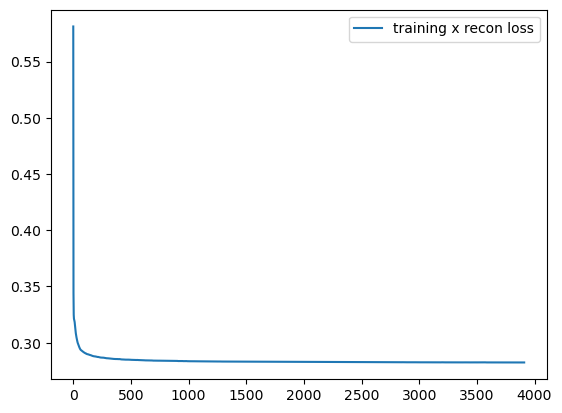

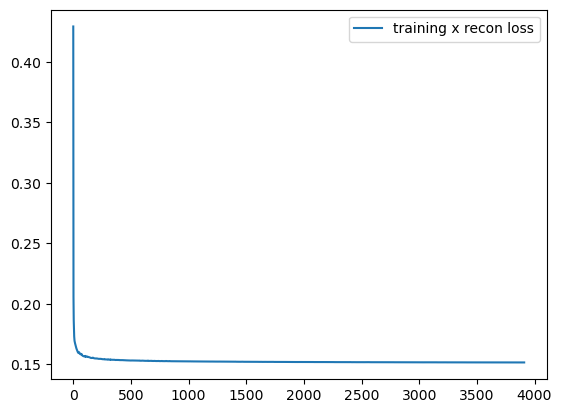

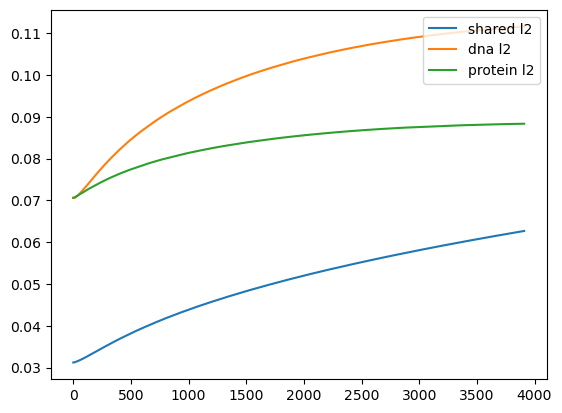

In [13]:
with open(os.path.join(modelsavepath_p_dna,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(stateDict_train_dna, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(modelsavepath_p_protein,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(stateDict_train_protein, output, pickle.HIGHEST_PROTOCOL)

with open(os.path.join(logsavepath_p_dna,'train_loss_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(train_loss, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath_p_dna,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(train_loss_x_dna, output, pickle.HIGHEST_PROTOCOL)

with open(os.path.join(logsavepath_p_protein,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(train_loss_x_protein, output, pickle.HIGHEST_PROTOCOL)
    
with open(os.path.join(logsavepath_p_dna,'train_lNorm_'+str(currLatentSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(train_lNorm, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath_p_dna,'train_lNormDNA_'+str(currLatentSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(train_lNorm_dna, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath_p_protein,'train_lNormProtein_'+str(currLatentSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(train_lNorm_protein, output, pickle.HIGHEST_PROTOCOL)


plt.plot(np.arange(epochs),train_loss_x_dna)
# plt.plot(np.arange(epochs),train_loss_kl_ep)
plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed3_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'.jpg'))
plt.show()


plt.plot(np.arange(epochs),train_loss_x_protein)
# plt.plot(np.arange(epochs),train_loss_kl_ep)
plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
plt.savefig(os.path.join(plotsavepath_p_protein,'loss_seed3_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'.jpg'))
plt.show()

plt.plot(np.arange(epochs),train_lNorm)
plt.plot(np.arange(epochs),train_lNorm_dna)
plt.plot(np.arange(epochs),train_lNorm_protein)
plt.legend(['shared l2','dna l2','protein l2'],loc='upper right')
plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed3_lNorm'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'.jpg'))
plt.show()


In [15]:
loadEpoch='3399'
modelsavepath_p_dna=os.path.join(modelsavepath_train,'dna')
modelsavepath_p_protein=os.path.join(modelsavepath_train,'protein')
for currLatentSize in sharedSizes:
    for dSpecificSize,dfilterSize in dSpecific_filter:
        latent_curr=None
#         if sIdx==0:
#             continue


        print(currLatentSize)
        print(dSpecificSize)
        dna_cShared=hidden5-dfilterSize
        p_cShared=dna_cShared


        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.enabled = True
        if modelname_train=='cnn_vae_pbmc_lord':
            modelcnn_dna_dec = model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,pIDemb_size,applySigmoid=False)
            modelcnn_protein_dec = model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,pIDemb_size,applySigmoid=False)
        modelcnn_dna_dec.cuda().eval()
        modelcnn_protein_dec.cuda().eval()
        
        latent_shared_dec=torch.nn.Embedding(proteinNames.size,currLatentSize)
        
        latent_protein_dec=torch.nn.Embedding(proteinNames.size,dSpecificSize)
        latent_dna_dec=torch.nn.Embedding(proteinNames.size,dSpecificSize)
        pIDemb_dec=torch.nn.Embedding(nProt, pIDemb_size).cuda()

        
        if loadEpoch is not None:
            with open(os.path.join(modelsavepath_p_dna,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(loadEpoch)), 'rb') as output:
                latent_dna_dec.weight=pickle.load(output)
            with open(os.path.join(modelsavepath_p_dna,'latentShared_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(loadEpoch)), 'rb') as output:
                latent_shared_dec.weight=pickle.load(output)
            with open(os.path.join(modelsavepath_p_protein,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(loadEpoch)), 'rb') as output:
                latent_protein_dec.weight=pickle.load(output)
            with open(os.path.join(modelsavepath_p_protein,'pIDemb_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(loadEpoch)), 'rb') as output:
                pIDemb_dec.weight=pickle.load(output)
            
            with open(os.path.join(modelsavepath_p_dna,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'rb') as output:
                stateDict_train_dna_dec=pickle.load(output)
            with open(os.path.join(modelsavepath_p_protein,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'rb') as output:
                stateDict_train_protein_dec=pickle.load(output)

            modelcnn_dna_dec.load_state_dict(stateDict_train_dna_dec[int(loadEpoch)])
            modelcnn_protein_dec.load_state_dict(stateDict_train_protein_dec[int(loadEpoch)])
        latent_shared_dec.weight.requires_grad=False
        
        latent_protein_dec.weight.requires_grad=False
        latent_dna_dec.weight.requires_grad=False
        pIDemb_dec.weight.requires_grad=False

1024
200


In [16]:
with torch.no_grad():
    i=0
    trainIdx_i=trainIdx[i*batchsize:min((i+1)*batchsize,trainIdx.shape[0])]
    traintarget_protein=torch.tensor(imgsP_all[trainIdx_i]).cuda().float()
    trainIdx_i=torch.tensor(trainIdx_i)
    traintarget_dna=torch.tensor(imgsC_all[trainIdx_i]).cuda().float()
    trainInput_ID=plabels[trainIdx_i].cuda()
    trainInput_shared=latent_shared_dec(trainIdx_i).cuda().float()
    trainInput_dna=latent_dna_dec(trainIdx_i).cuda().float()
    trainInput_protein=latent_protein_dec(trainIdx_i).cuda().float()
    #         print(trainInput.shape)


    recon_dna= modelcnn_dna_dec(torch.cat((trainInput_shared,trainInput_dna),dim=1),pIDemb_dec(trainInput_ID))
    recon_protein= modelcnn_protein_dec(torch.cat((trainInput_shared,trainInput_protein),dim=1),pIDemb_dec(trainInput_ID))


0


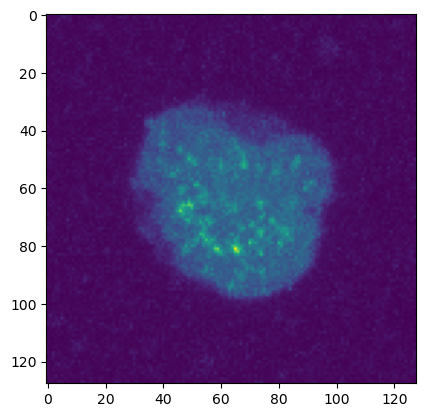

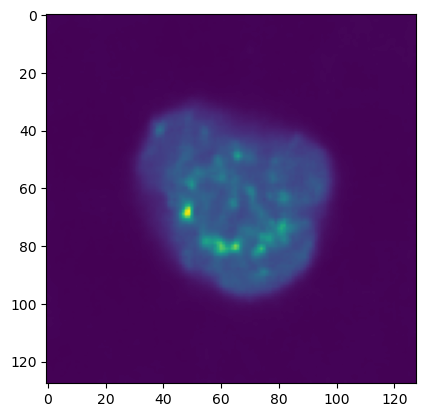

1


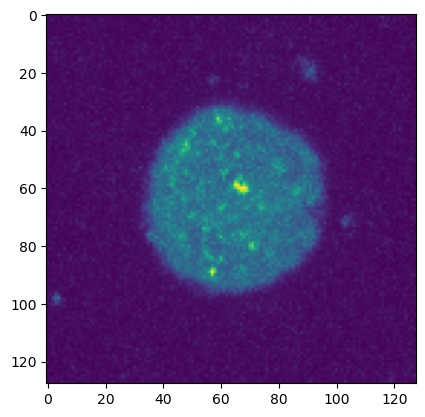

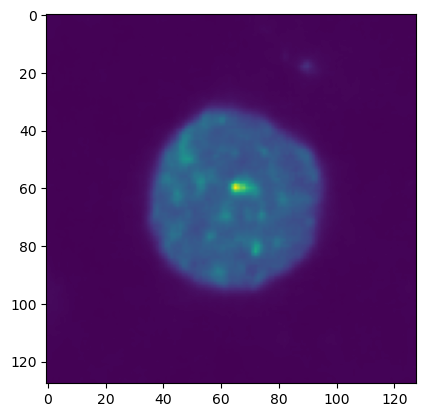

2


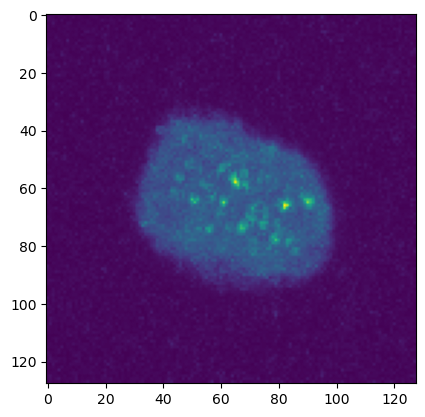

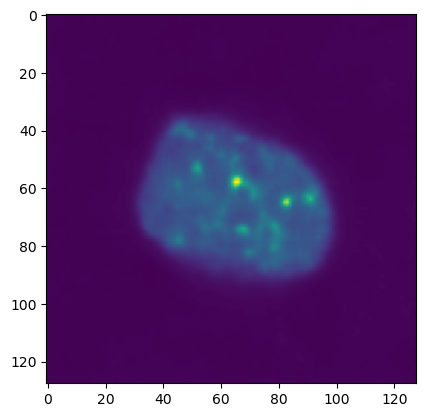

3


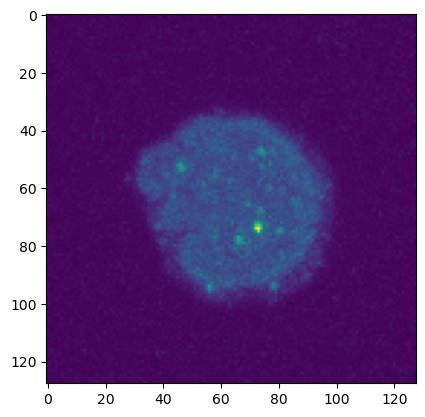

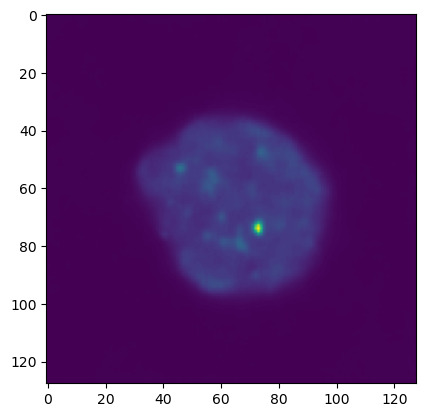

4


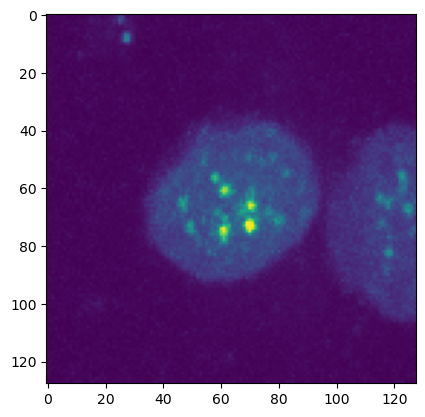

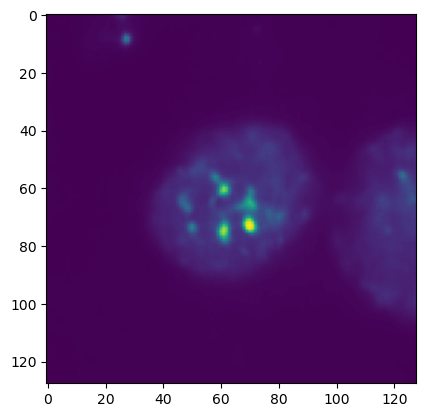

5


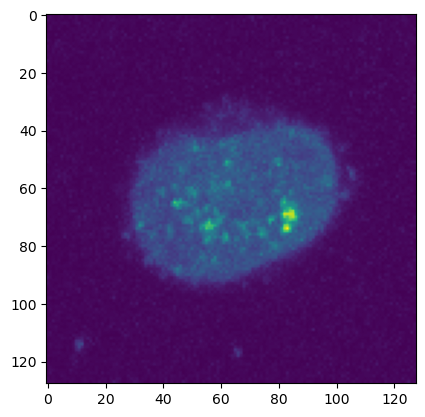

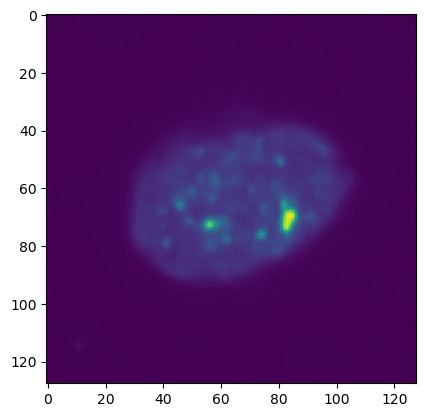

6


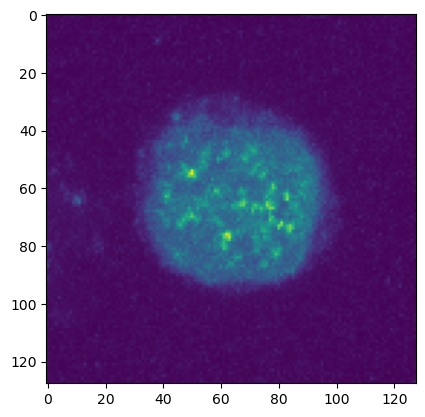

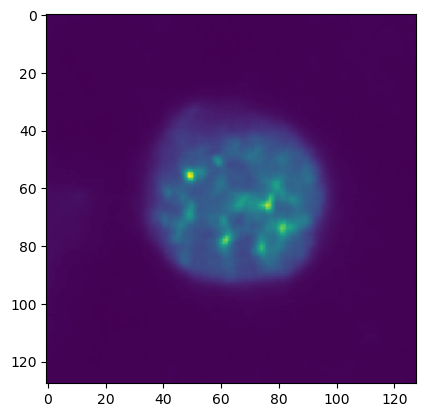

7


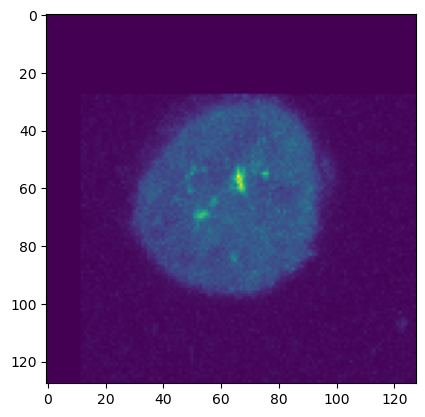

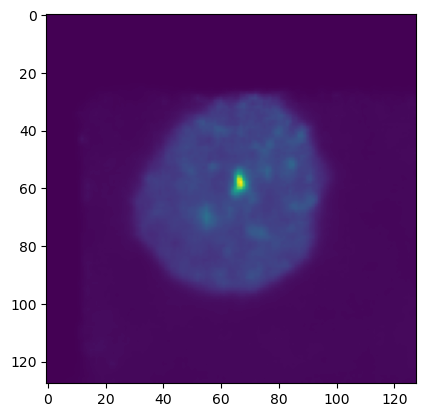

8


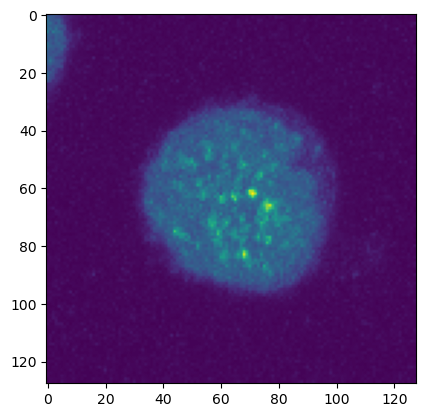

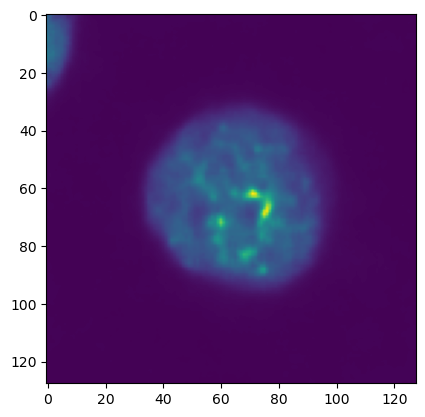

9


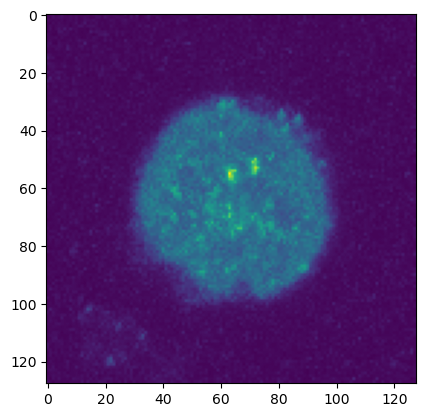

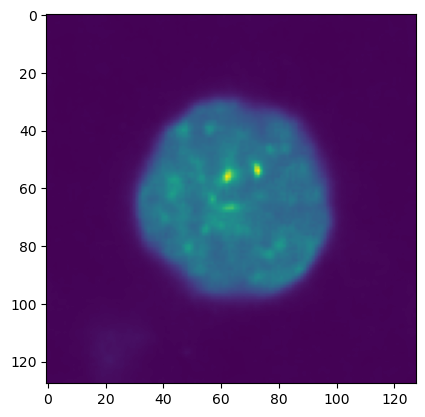

10


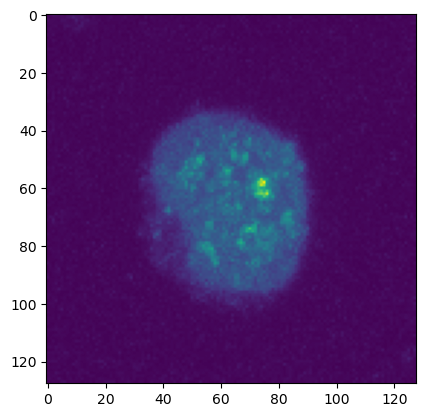

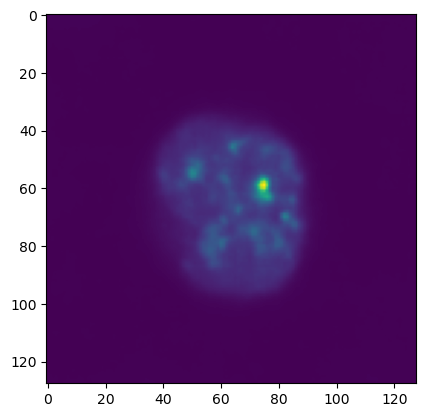

11


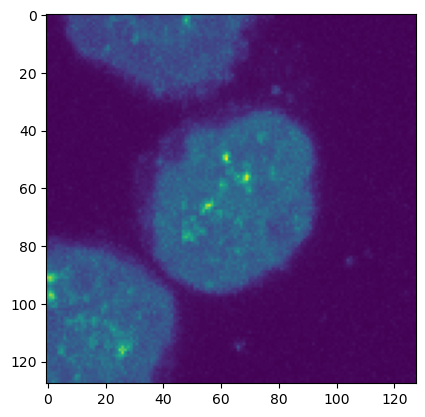

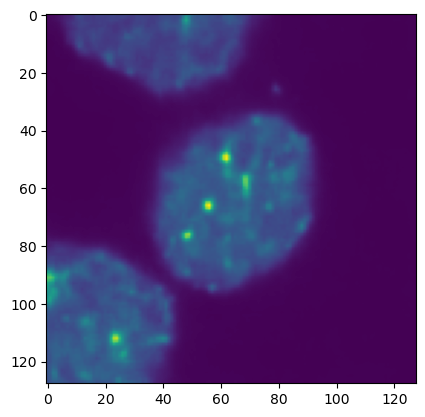

12


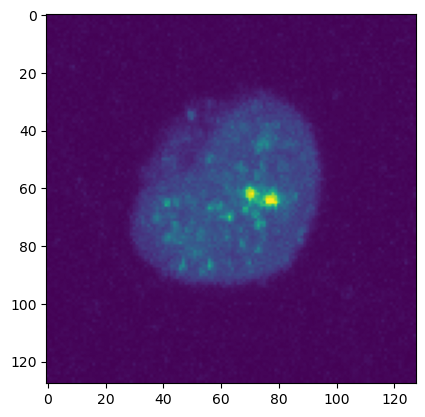

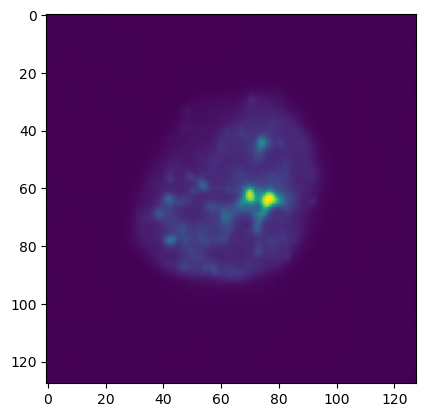

13


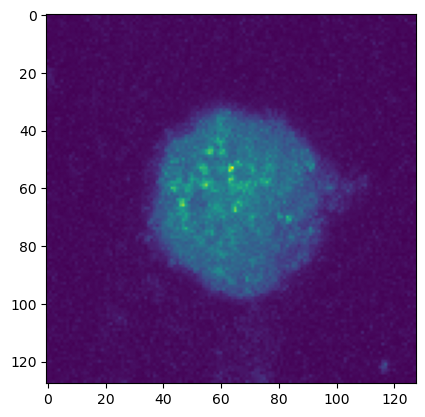

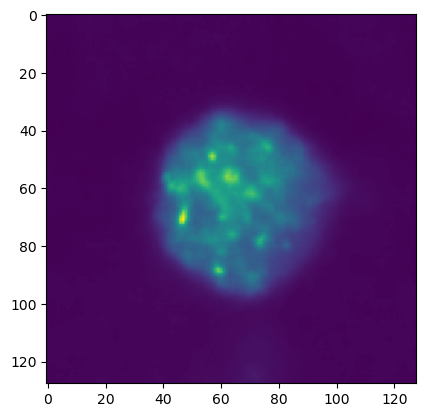

14


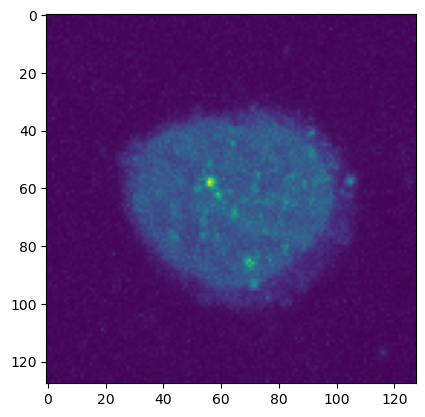

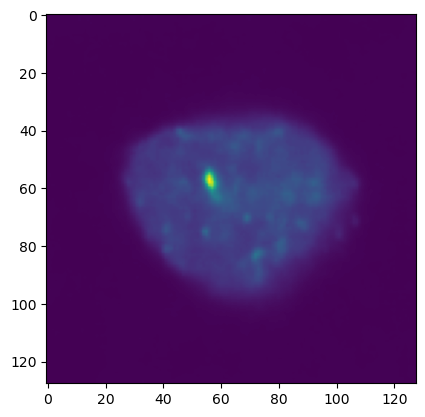

15


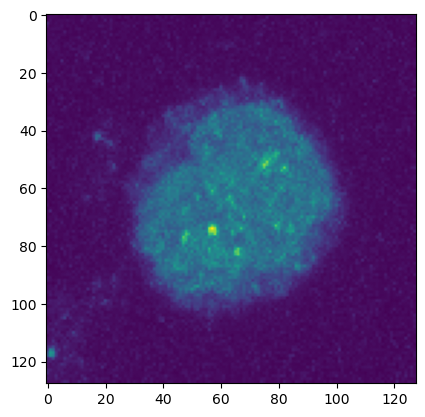

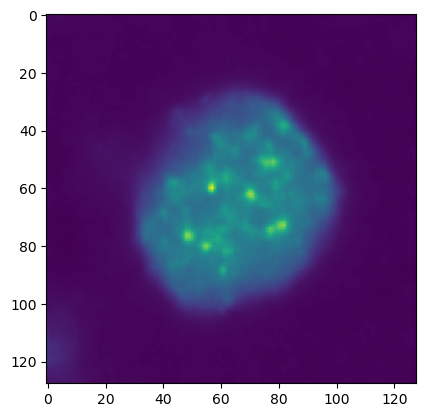

16


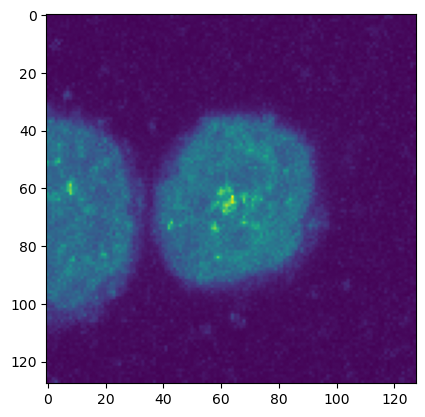

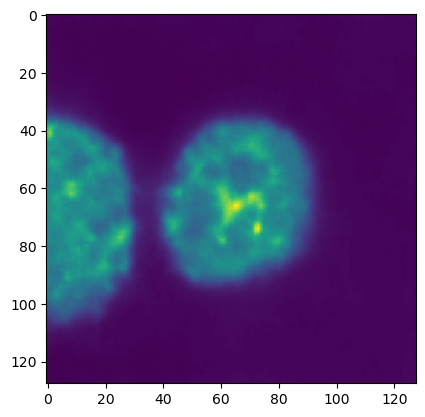

17


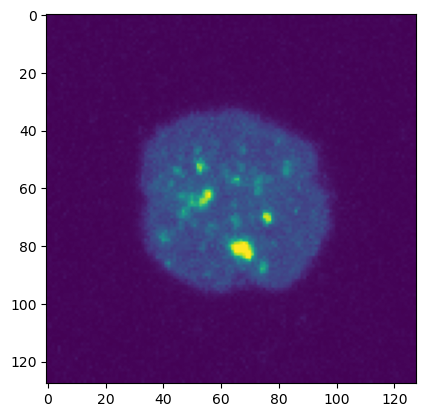

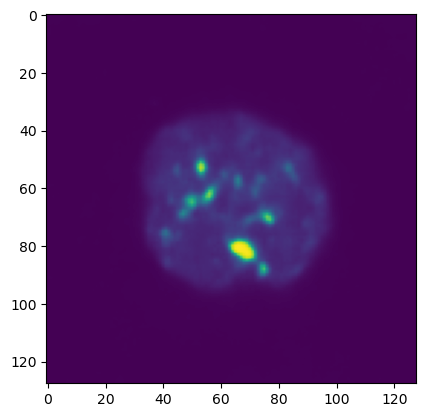

18


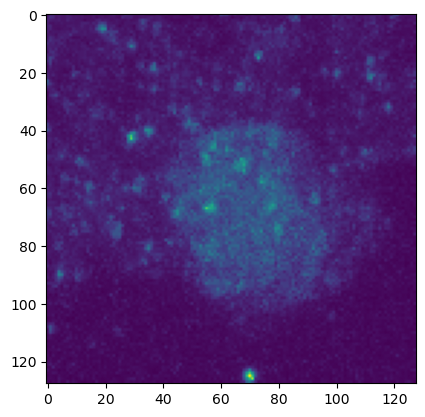

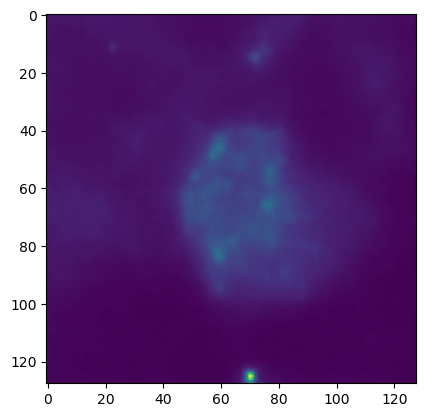

19


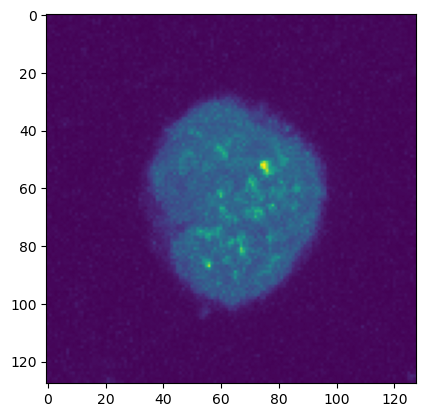

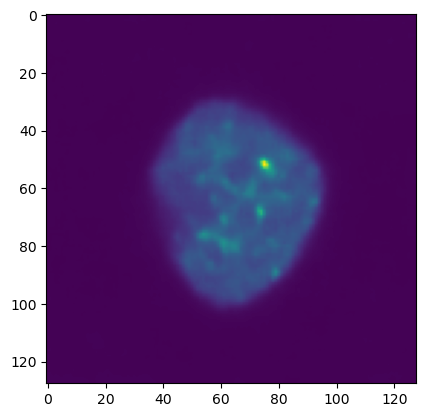

In [17]:
sigmoid=torch.nn.Sigmoid()
for i in range(20):
    print(i)
    plt.imshow(sigmoid(traintarget_protein[i][0]).cpu().detach().numpy())
    plt.show()
    plt.imshow(sigmoid(recon_protein[i][0]).cpu().detach().numpy())
    plt.show()

0


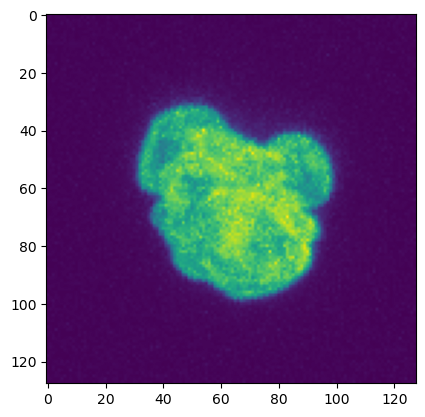

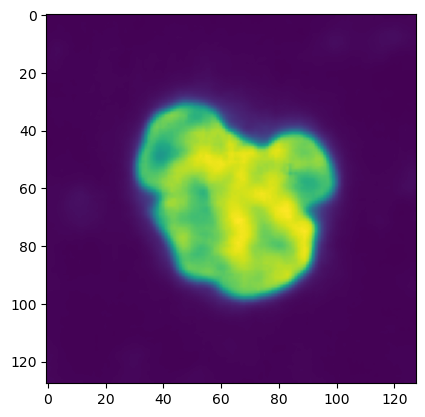

1


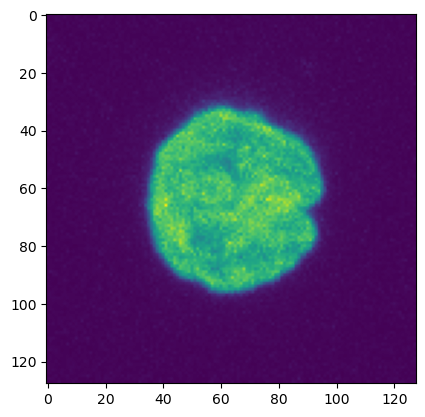

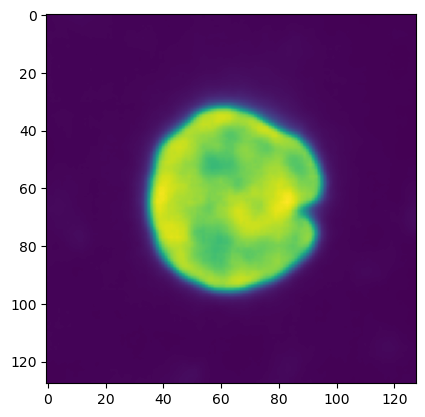

2


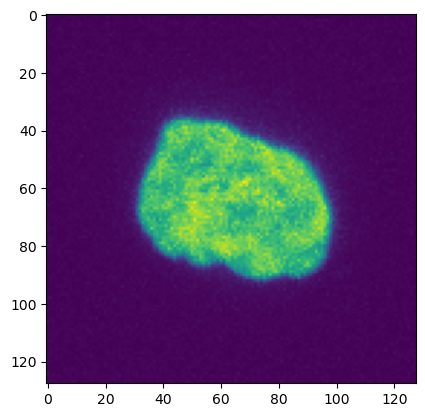

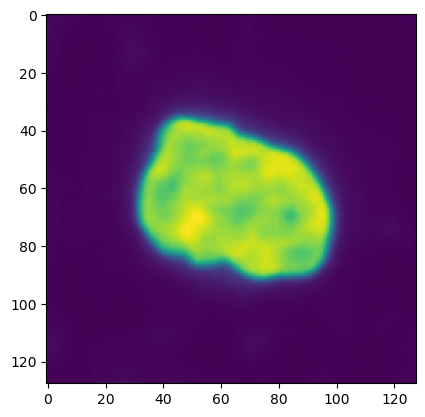

3


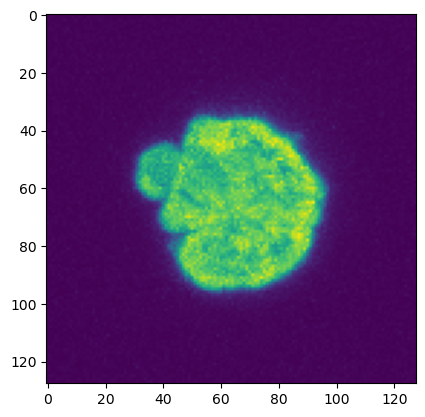

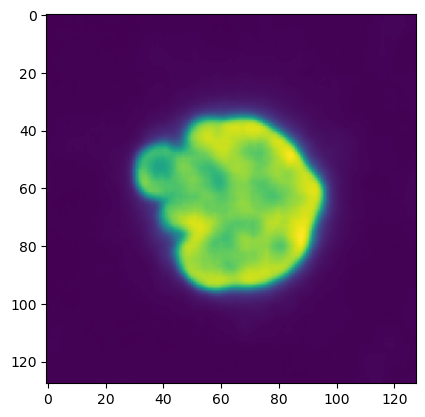

4


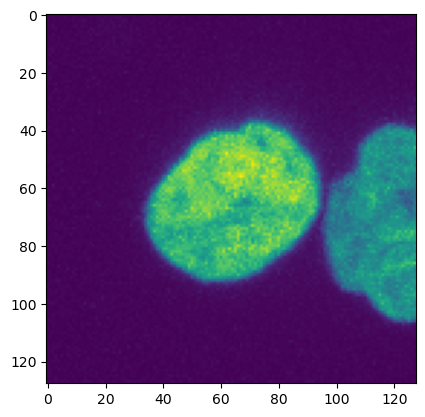

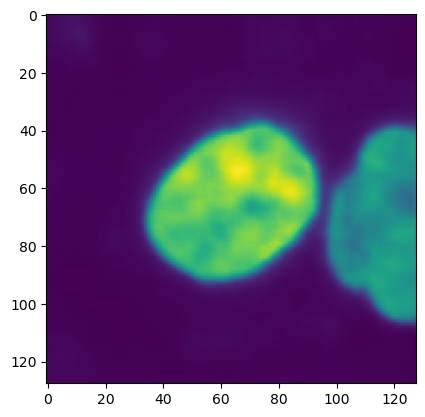

5


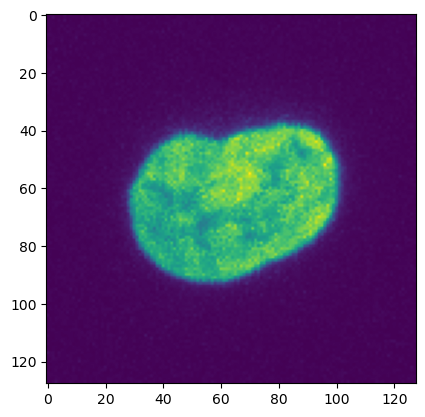

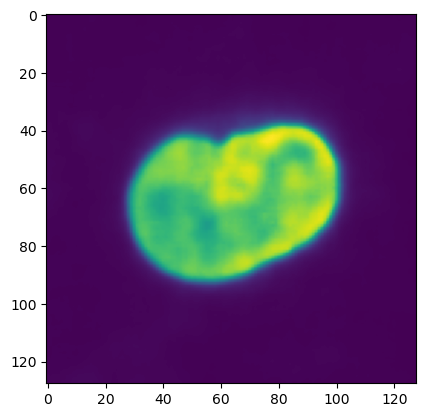

6


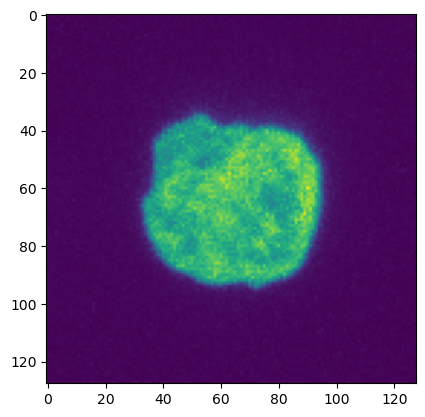

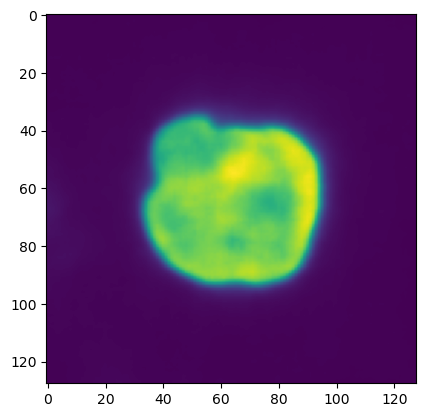

7


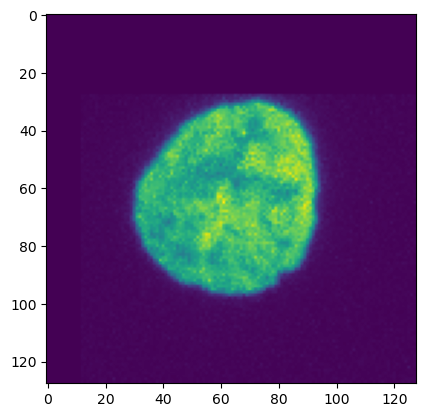

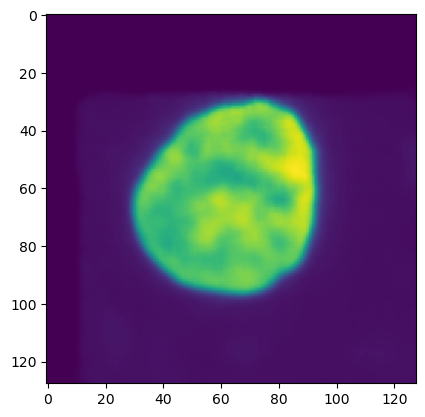

8


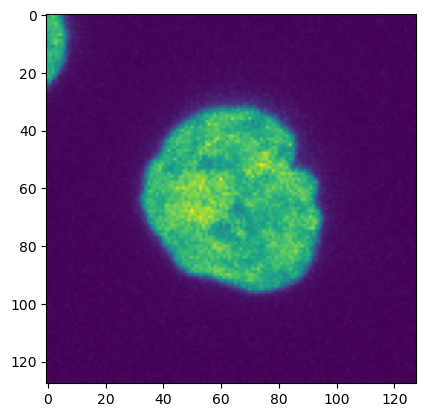

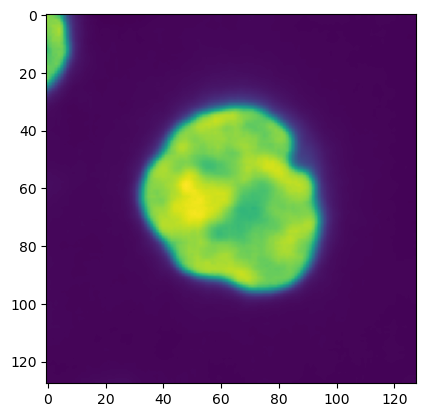

9


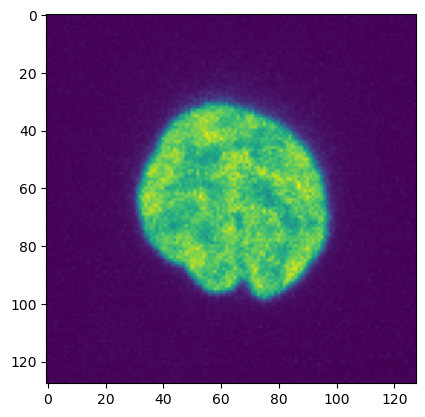

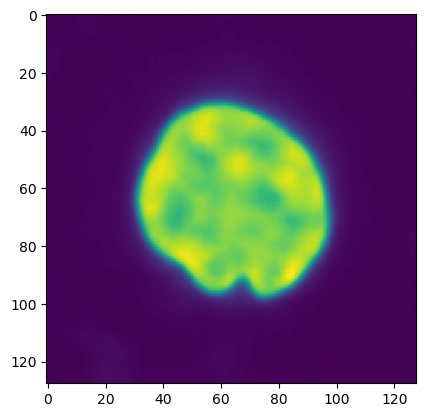

10


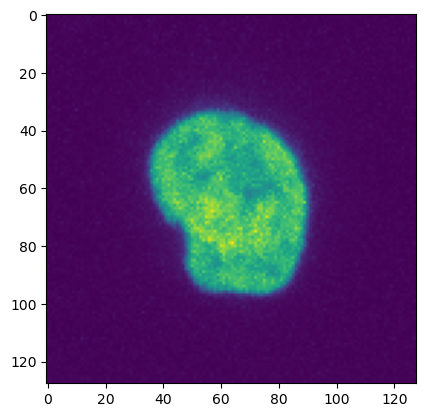

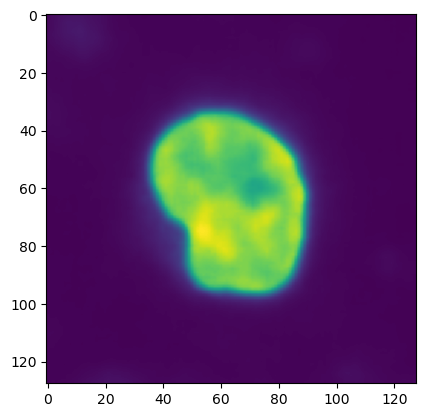

11


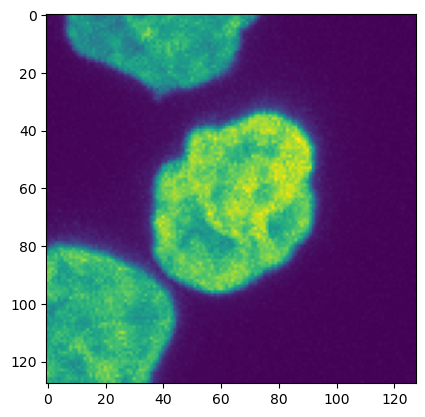

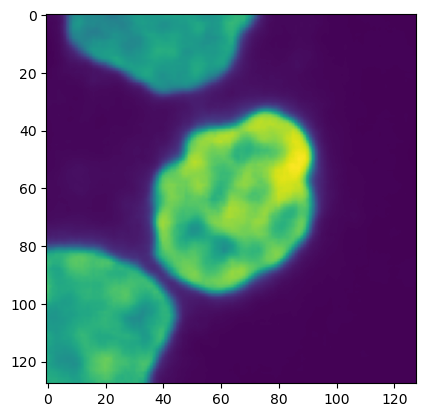

12


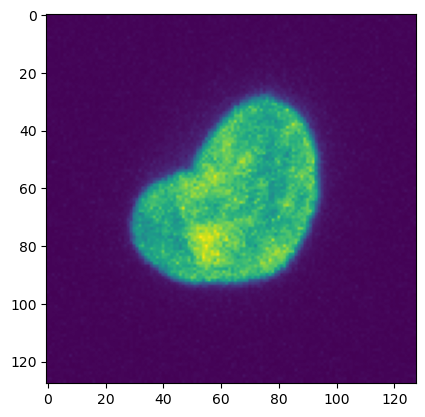

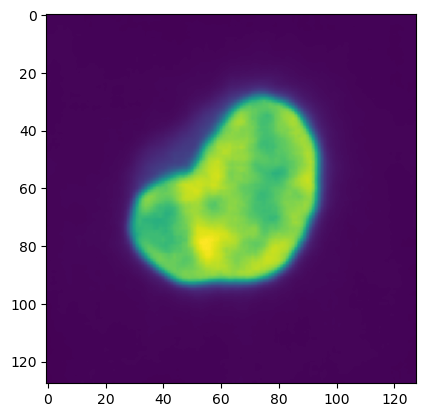

13


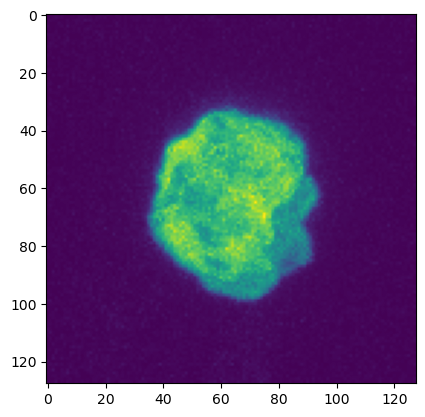

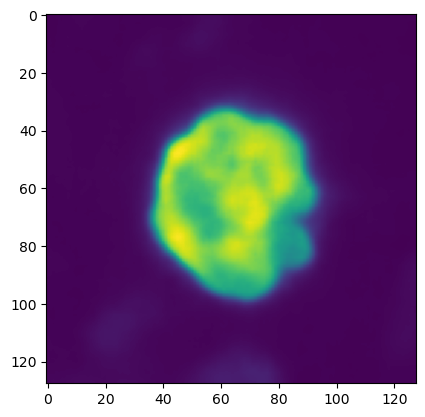

14


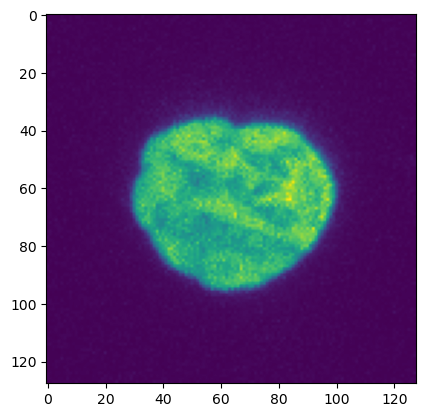

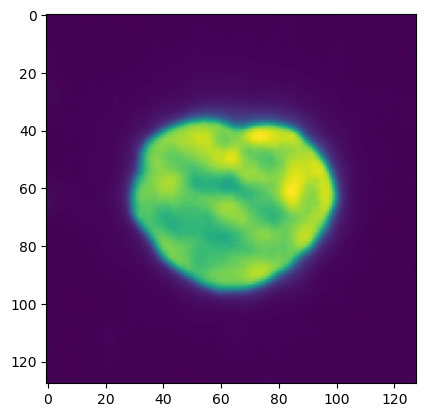

15


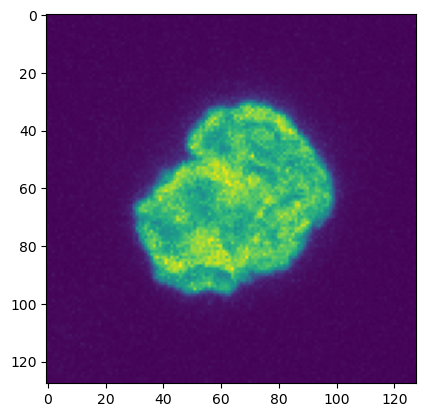

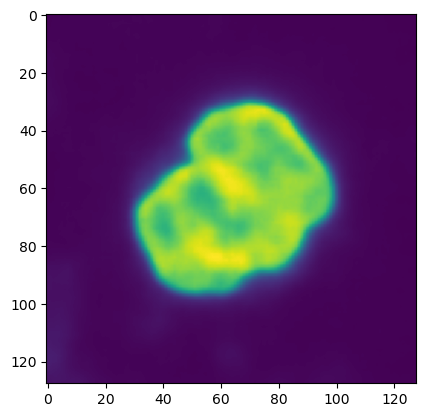

16


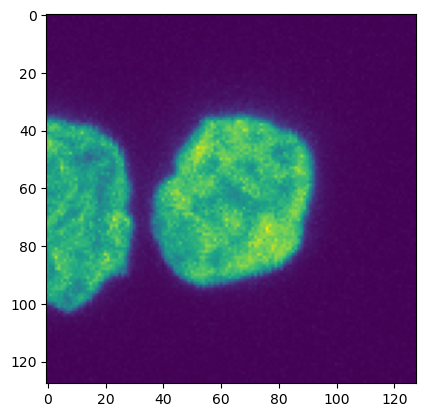

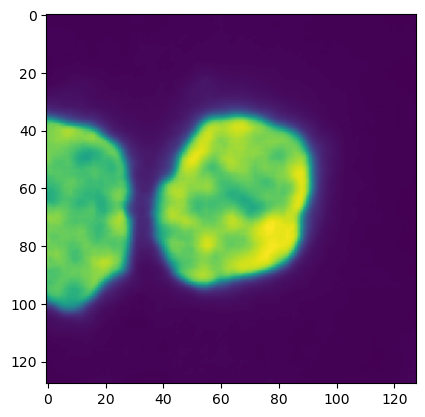

17


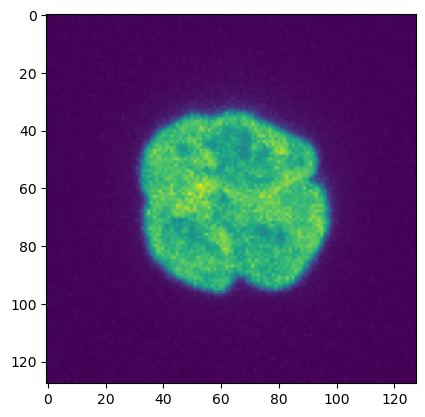

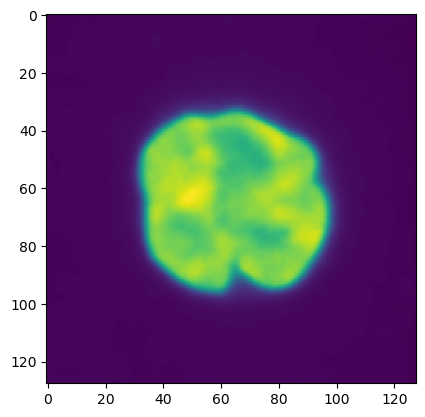

18


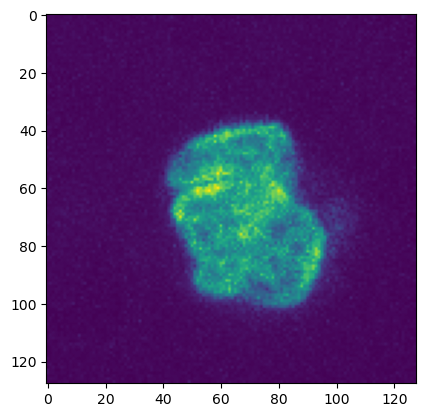

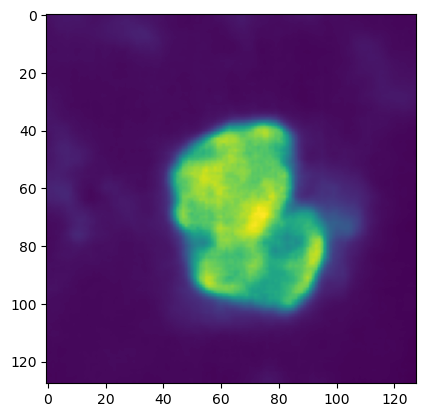

19


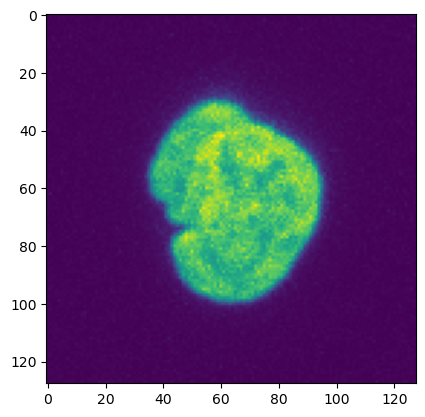

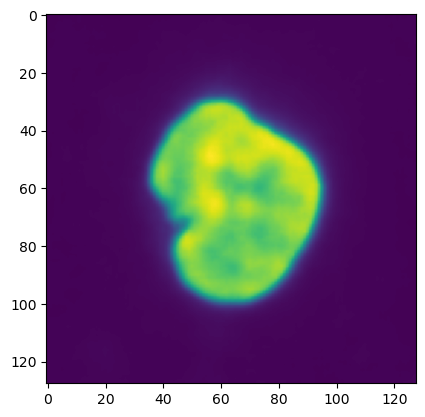

In [18]:
for i in range(20):
    print(i)
    plt.imshow(sigmoid(traintarget_dna[i][0]).cpu().detach().numpy())
    plt.show()
    plt.imshow(sigmoid(recon_dna[i][0]).cpu().detach().numpy())
    plt.show()